In this notebook, we test the performance of our best models with an enhanced data set. Therefore, we extracted the same features for RAVDESS and IEMOCAP as for EmoDB. We will look at the performance of the models with the same chosen features separately on the new data set and as a combined approach. Moreover, we will perform another feature selection with Featurewiz on each newly created data set.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pickle

# packages for models
import sklearn
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# dimensionality reduction
from featurewiz import FeatureWiz

# import own functions
from ipynb.fs.full.Functions import load_train_test_data, model_eval, run_gridsearchCV, load_model, feature_importance

pd.set_option('display.max_columns', None)
np.random.seed(0)

import warnings
warnings.filterwarnings('ignore')

Imported 0.3.2 version. Select nrows to a small number when running on huge datasets.
output = featurewiz(dataname, target, corr_limit=0.90, verbose=2, sep=',', 
		header=0, test_data='',feature_engg='', category_encoders='',
		dask_xgboost_flag=False, nrows=None, skip_sulov=False, skip_xgboost=False)
Create new features via 'feature_engg' flag : ['interactions','groupby','target']



In [2]:
def missing_cols(features1, features2):
    """
    Function checks whether there are missing features in one of the given feature sets.
    """
    missing_1 = list(set(features2) - set(features1))
    missing_2 = list(set(features1) - set(features2))
    return missing_1 + missing_2

# 1) RAVDESS only
## a) Ravdess with most important features from featurewiz 215

In [3]:
# load most important 215 features from featurewiz selection on 70-30 split
with open('../results/most_important_features_70_30_split_215.pkl', 'rb') as f:
    most_imp_features = pickle.load(f)

# add label 
most_imp_features.append('label')
    
# load data
df_ravdess = pd.read_pickle('../results/df_prep_numerical_only_all_stats_ravdess.pkl')

# check if there are any features in the saved set of most important features from emodb
mis_cols = list(set(most_imp_features) - set(df_ravdess.columns.to_list()))
print(f'{mis_cols} are missing in the Ravdess feature set and are removed from the list.')
for feat in mis_cols:
    most_imp_features.remove(feat) 

# select features
df_ravdess_most_imp215 = df_ravdess[most_imp_features]

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_ravdess_most_imp215, test_size=0.3)

['lpcmfccs_local0_var', 'lpcmfccs_local5_var', 'lpcmfccs_local1_var'] are missing in the Ravdess feature set and are removed from the list.
A snippet of the data:


,rms_min,lpc_global_mean,value_rising_pitch_iqr,mfccs5_mean,lpc_local4_mean,voiced_var,f1_std,mfccs0_mean,duration_rising_pitch_max,lfccs4_var,spectral_entropy_min,zcr_max,lfccs3_median,skew_log_pitch,duration_rising_pitch_median,speaking_rate,delta_mfccs0_min,shannon_entropy_mean,rms_max,lpcmfccs_local0_median,lfccs5_var,mfccs10_median,lpcmfccs_local10_median,range_log_pitch,delta_mfccs0_mean,mfccs6_median,f1_mean,lfccs9_max,f4_mean,lfccs2_mean,value_rising_pitch_median,amplitude_avg_change_rate_mean,lpc_local2_min,lpc_local3_var,mfccs4_max,duration_falling_pitch_mean,mfccs5_var,lpcmfccs_local4_max,pitch_time_median,value_falling_energy_max,lfccs7_mean,delta_mfccs0_median,value_falling_pitch_max,mfccs9_mean,lfccs11_var,lfccs0_max,value_rising_pitch_mean,delta2_mfccs3_max,spectral_entropy_max,value_falling_pitch_median,amplitude_avg_change_rate_min,delta_mfccs11_max,spectral_centroid_median,f2_var,lpccs_local5_mean,delta2_mfccs0_mean,delta2_mfccs3_min,duration_rising_pitch_iqr,lfccs4_mean,energy_var,mfccs0_max,delta_mfccs7_var,lfccs9_median,f4_avg_change_rate_mean,f1_avg_change_rate_max,mfccs4_min,f2_avg_change_rate_var,threshold_entropy_var,f1_avg_change_rate_median,energy_max,delta2_mfccs6_var,delta_mfccs2_mean,lpc_local4_min,delta2_mfccs2_max,mfccs3_max,delta_mfccs0_var,delta_mfccs1_median,lpccs_local6_min,lfccs2_min,shannon_entropy_var,range_log_energy,lfccs8_var,threshold_entropy_max,value_falling_energy_min,lfccs6_mean,lfccs6_max,zcr_min,delta_mfccs7_mean,f1_avg_change_rate_mean,delta2_mfccs8_mean,delta_mfccs8_min,duration_rising_energy_var,delta2_mfccs2_median,delta_mfccs8_mean,sure_entropy_mean,duration_rising_energy_mean,min,delta2_mfccs11_var,spectral_entropy_var,f2_max,f0_median,max,amplitude_avg_change_rate_max,mfccs9_max,lfccs4_max,mfccs11_max,energy_avg_change_rate_mean,duration_falling_energy_mean,f3_mean,mean,lfccs11_mean,f2_mean,lfccs2_var,f4_avg_change_rate_median,f4_max,lfccs7_var,delta_mfccs11_median,delta_mfccs6_median,f4_avg_change_rate_min,pitch_time_mean,lpcmfccs_local0_min,log_energy_entropy_mean,lpccs_global_median,lfccs11_max,delta2_mfccs3_mean,mfccs1_max,delta2_mfccs3_var,mfccs2_var,delta2_mfccs4_var,lfccs8_max,delta_mfccs0_max,delta_mfccs9_max,delta_mfccs6_max,delta_mfccs5_mean,lfccs8_mean,lfccs10_median,duration_rising_energy_iqr,delta_mfccs9_var,amplitude_var,lpcmfccs_global_min,delta_mfccs3_min,delta_mfccs10_var,value_falling_energy_median,lfccs2_max,lfccs3_var,delta_mfccs4_max,delta_mfccs12_mean,lfccs3_max,delta_mfccs6_mean,mfccs3_median,delta2_mfccs12_mean,delta2_mfccs2_mean,value_falling_pitch_min,delta_mfccs11_mean,mfccs12_min,delta_mfccs6_var,f2_avg_change_rate_median,delta2_mfccs12_median,delta2_mfccs11_median,delta2_mfccs9_min,lpccs_local4_min,f3_std,mfccs7_median,lpc_local1_max,f3_min,delta2_mfccs10_median,delta2_mfccs10_mean,f3_avg_change_rate_mean,duration_falling_energy_var,f4_min,mfccs12_var,threshold_entropy_mean,f3_avg_change_rate_min,delta2_mfccs11_mean,delta2_mfccs0_var,energy_avg_change_rate_max,lpcmfccs_global_max,lfccs6_min,f1_min,energy_median,f4_std,f0_var,mfccs8_mean,delta_mfccs8_max,delta2_mfccs1_max,lfccs0_var,mfccs3_min,delta2_mfccs10_min,lpc_local1_median,lfccs9_min,mfccs11_min,lpc_local1_var,duration_falling_pitch_max,lpc_local1_min,delta2_mfccs1_min,delta_mfccs5_min,mfccs3_var,lfccs5_min,mfccs7_min,delta2_mfccs5_max,lpccs_local10_min,delta2_mfccs7_mean,energy_avg_change_rate_var,delta2_mfccs7_var,delta2_mfccs8_max,lfccs10_var,delta_mfccs3_max,mfccs11_median,mfccs8_min,delta2_mfccs10_max,lfccs5_max,duration_rising_pitch_min
9,-0.380274,-0.864635,-0.300288,0.163723,0.337672,0.070404,-0.722419,0.075468,0.181023,-0.483702,-1.161159,-0.676625,0.525463,0.904656,0.095726,0.589228,0.661801,0.083571,-0.154833,-1.001211,-1.383913,-1.290561,0.218710,1.208619,-0.119665,0.112236,-0.905924,0.235901,-0.661457,1.359727,0.476915,0.112013,0.046745,-0.036946,-0.556727,0.037059,0.693738,-0.036811,-0.255829,0.084571,0.789630,0.304581,0.197378,0.143233,0.878038,-0.397102,0.962574,-0.112568

There are 739 entries with 212 columns in the training data.
There are 317 entries with 212 columns in the testing data.


### SVM


Evaluation: f1_score
100.00% for the train data
71.71% for the test data

Evaluation: accuracy_score
100.00% for the train data
73.19% for the test data

Evaluation: precision_score
100.00% for the train data
72.60% for the test data

Evaluation: recall_score
100.00% for the train data
71.75% for the test data

Evaluation: confusion_matrix of test predictions


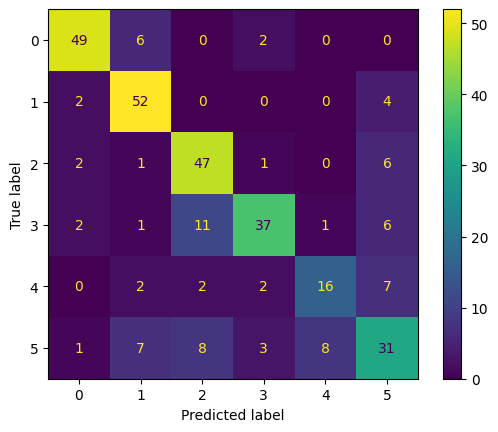


Hard cases for the model:

Label: neutral(4)
Hard cases of false negatives: ['sadness(5)']
Hard cases of false positives: ['sadness(5)']



In [4]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_ravdess = SVC().set_params(**svm_best_model.get_params())
svm_ravdess.fit(X_train, y_train)
model_eval(svm_ravdess, X_train, X_test, y_train, y_test, confusion=True, emotions='ravdess')

### Random Forest


Evaluation: f1_score
100.00% for the train data
61.76% for the test data

Evaluation: accuracy_score
100.00% for the train data
62.46% for the test data

Evaluation: precision_score
100.00% for the train data
61.93% for the test data

Evaluation: recall_score
100.00% for the train data
62.17% for the test data

Evaluation: confusion_matrix of test predictions


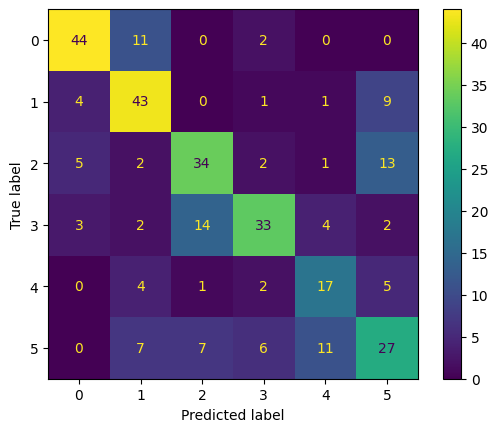


Hard cases for the model:

Label: fear(2)
Hard cases of false negatives: ['sadness(5)']
Hard cases of false positives: ['happiness(3)']

Label: happiness(3)
Hard cases of false negatives: ['fear(2)']

Label: neutral(4)
Hard cases of false positives: ['sadness(5)']

Label: sadness(5)
Hard cases of false positives: ['fear(2)']



In [5]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_ravdess = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_ravdess.fit(X_train, y_train)
model_eval(rfc_ravdess, X_train, X_test, y_train, y_test, confusion=True, emotions='ravdess')

### XGB


Evaluation: f1_score
100.00% for the train data
65.60% for the test data

Evaluation: accuracy_score
100.00% for the train data
66.25% for the test data

Evaluation: precision_score
100.00% for the train data
66.11% for the test data

Evaluation: recall_score
100.00% for the train data
65.38% for the test data

Evaluation: confusion_matrix of test predictions


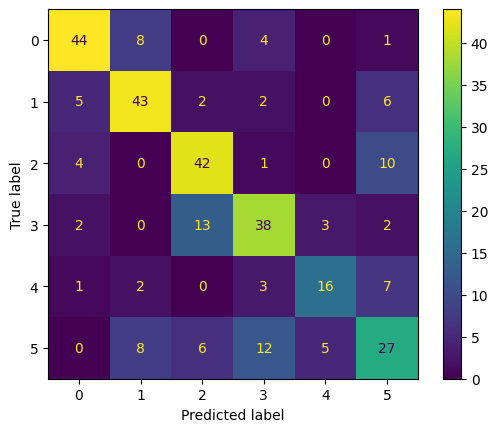


Hard cases for the model:

Label: fear(2)
Hard cases of false positives: ['happiness(3)']

Label: happiness(3)
Hard cases of false negatives: ['fear(2)']

Label: neutral(4)
Hard cases of false negatives: ['sadness(5)']
Hard cases of false positives: ['sadness(5)']

Label: sadness(5)
Hard cases of false negatives: ['happiness(3)']



In [6]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_ravdess = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_ravdess.fit(X_train, y_train)
model_eval(xgb_ravdess, X_train, X_test, y_train, y_test, confusion=True, emotions='ravdess')

## b) RAVDESS own feature selection

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (739, 578)
#### Single_Label Multi_Classification problem ####
No test data filename give

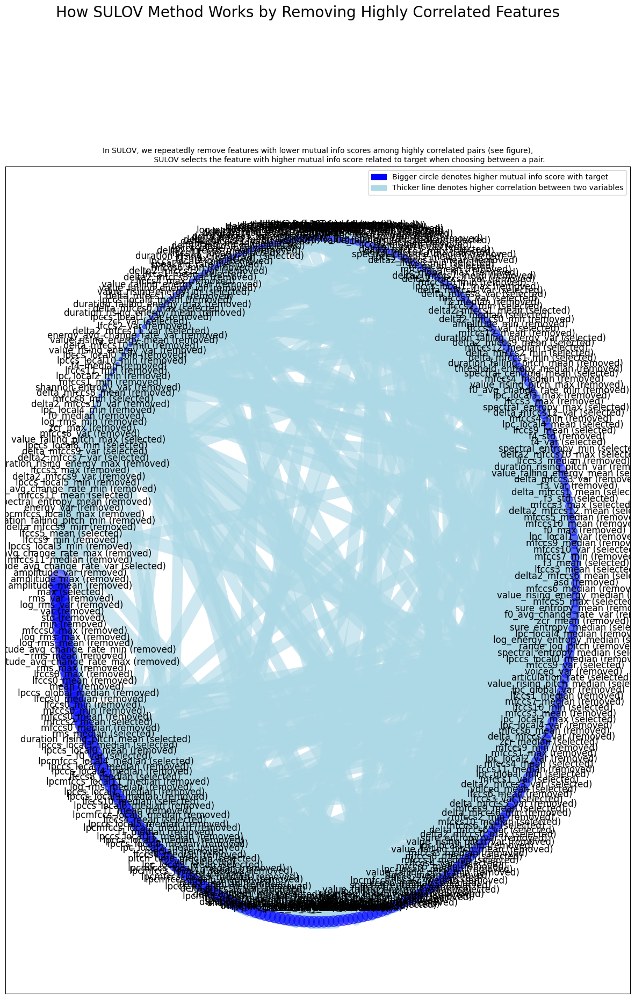

Time taken for SULOV method = 13 seconds
    Adding 0 categorical variables to reduced numeric variables  of 371
Finally 371 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 115 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 9 seconds
            Time taken for regular XGBoost feature selection = 6 seconds
            Time taken for regular XGBoost feature selection = 5 seconds
            Time taken for regular XGBoost feature selection = 5 seconds
            Time taken for regular XGBoost feature selection = 4 secon

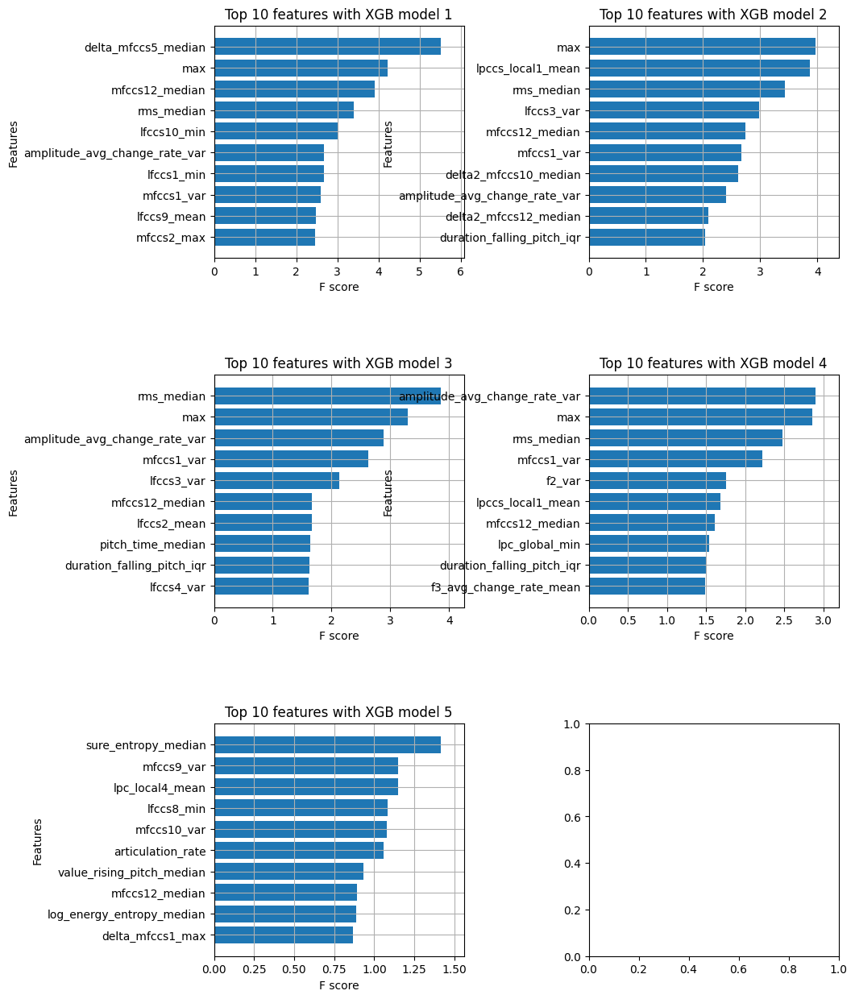

    Completed XGBoost feature selection in 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 210 important features. Too many to print...
Total Time taken for featurewiz selection = 45 seconds
Output contains a list of 210 important features and a train dataframe
    Time taken to create entire pipeline = 47 second(s)


In [4]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_ravdess, verbose=False, test_size=0.3)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  

### SVM


Evaluation: f1_score
100.00% for the train data
73.59% for the test data

Evaluation: accuracy_score
100.00% for the train data
74.13% for the test data

Evaluation: precision_score
100.00% for the train data
74.55% for the test data

Evaluation: recall_score
100.00% for the train data
73.16% for the test data

Evaluation: confusion_matrix of test predictions


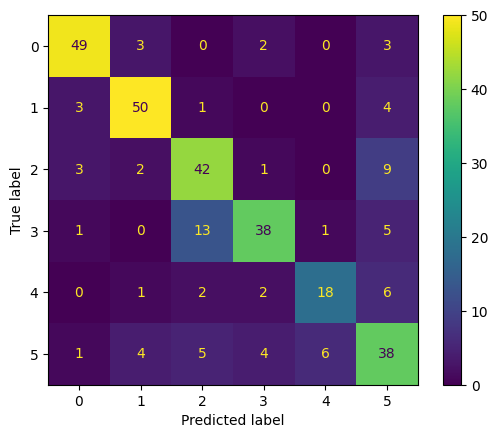


Hard cases for the model:

Label: fear(2)
Hard cases of false positives: ['happiness(3)']

Label: happiness(3)
Hard cases of false negatives: ['fear(2)']

Label: neutral(4)
Hard cases of false negatives: ['sadness(5)']
Hard cases of false positives: ['sadness(5)']



In [5]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_ravdess_reduced = SVC().set_params(**svm_best_model.get_params())
svm_ravdess_reduced.fit(X_train, y_train)
model_eval(svm_ravdess_reduced, X_train, X_test, y_train, y_test, confusion=True, emotions='ravdess')

RBF kernel. Computing permutation importance.


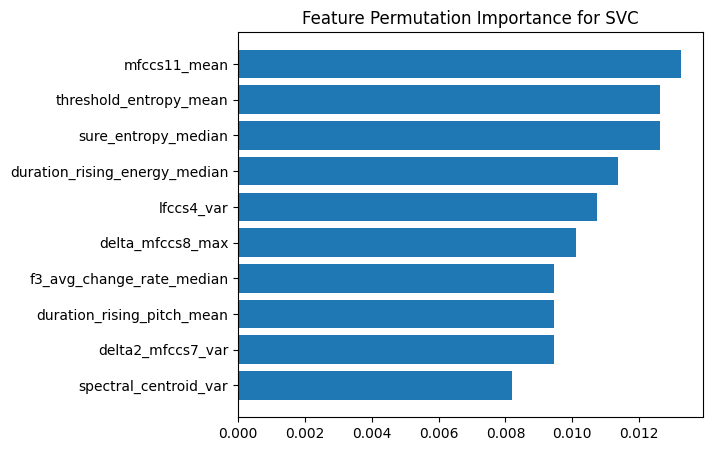

In [6]:
feature_imp_svm = feature_importance(svm_ravdess_reduced, X_test, y_test, top=10)

In [10]:
feature_imp_svm

('mfccs11_mean',
 'threshold_entropy_mean',
 'sure_entropy_median',
 'duration_rising_energy_median',
 'lfccs4_var',
 'delta_mfccs8_max',
 'f3_avg_change_rate_median',
 'duration_rising_pitch_mean',
 'delta2_mfccs7_var',
 'spectral_centroid_var')

### Random Forest


Evaluation: f1_score
100.00% for the train data
64.68% for the test data

Evaluation: accuracy_score
100.00% for the train data
64.98% for the test data

Evaluation: precision_score
100.00% for the train data
64.61% for the test data

Evaluation: recall_score
100.00% for the train data
65.95% for the test data

Evaluation: confusion_matrix of test predictions


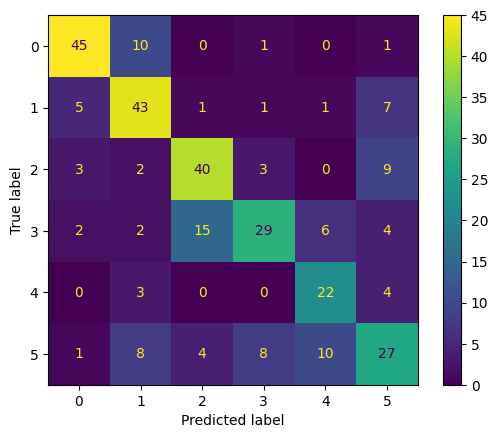


Hard cases for the model:

Label: fear(2)
Hard cases of false positives: ['happiness(3)']

Label: happiness(3)
Hard cases of false negatives: ['fear(2)']

Label: neutral(4)
Hard cases of false positives: ['sadness(5)']



In [11]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_ravdess_reduced = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_ravdess_reduced.fit(X_train, y_train)
model_eval(rfc_ravdess_reduced, X_train, X_test, y_train, y_test, confusion=True, emotions='ravdess')

### XGB


Evaluation: f1_score
100.00% for the train data
69.78% for the test data

Evaluation: accuracy_score
100.00% for the train data
70.35% for the test data

Evaluation: precision_score
100.00% for the train data
71.07% for the test data

Evaluation: recall_score
100.00% for the train data
69.14% for the test data

Evaluation: confusion_matrix of test predictions


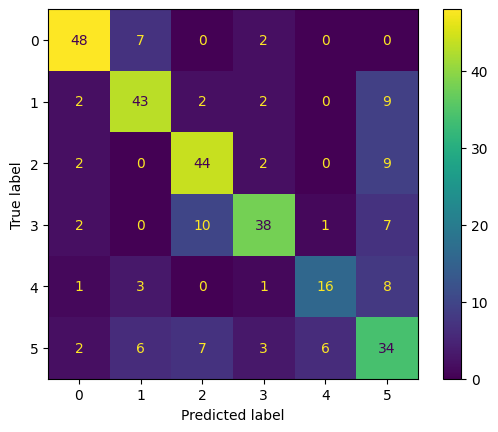


Hard cases for the model:

Label: neutral(4)
Hard cases of false negatives: ['sadness(5)']
Hard cases of false positives: ['sadness(5)']



In [12]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_ravdess_reduced = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_ravdess_reduced.fit(X_train, y_train)
model_eval(xgb_ravdess_reduced, X_train, X_test, y_train, y_test, confusion=True, emotions='ravdess')

# 2) EmoDB + RAVDESS
## a) EmoDB + Ravdess with most important features from featurewiz 215

In [7]:
# load most important 215 features from featurewiz selection on 70-30 split
with open('../results/most_important_features_70_30_split_215.pkl', 'rb') as f:
    most_imp_features = pickle.load(f)

# add label 
most_imp_features.append('label')
    
# load data
df_emo_rav = pd.read_pickle('../results/df_prep_numerical_only_all_stats_emodb_ravdess.pkl')

# check if there are any features in the saved set of most important features from emodb
mis_cols = list(set(most_imp_features) - set(df_emo_rav.columns.to_list()))
print(f'{mis_cols} are missing in the Ravdess feature set and are removed from the list.')
for feat in mis_cols:
    most_imp_features.remove(feat) 

# select features
df_emo_rav_most_imp215 = df_emo_rav[most_imp_features]

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_emo_rav_most_imp215, test_size=0.3)

['lpcmfccs_local5_var'] are missing in the Ravdess feature set and are removed from the list.
A snippet of the data:


,rms_min,lpc_global_mean,value_rising_pitch_iqr,mfccs5_mean,lpc_local4_mean,voiced_var,f1_std,mfccs0_mean,duration_rising_pitch_max,lfccs4_var,spectral_entropy_min,zcr_max,lfccs3_median,skew_log_pitch,duration_rising_pitch_median,speaking_rate,delta_mfccs0_min,shannon_entropy_mean,rms_max,lpcmfccs_local0_median,lfccs5_var,mfccs10_median,lpcmfccs_local10_median,range_log_pitch,delta_mfccs0_mean,mfccs6_median,f1_mean,lfccs9_max,f4_mean,lfccs2_mean,value_rising_pitch_median,amplitude_avg_change_rate_mean,lpc_local2_min,lpc_local3_var,mfccs4_max,duration_falling_pitch_mean,mfccs5_var,lpcmfccs_local4_max,pitch_time_median,value_falling_energy_max,lfccs7_mean,delta_mfccs0_median,value_falling_pitch_max,mfccs9_mean,lfccs11_var,lfccs0_max,value_rising_pitch_mean,delta2_mfccs3_max,spectral_entropy_max,value_falling_pitch_median,amplitude_avg_change_rate_min,delta_mfccs11_max,spectral_centroid_median,f2_var,lpccs_local5_mean,delta2_mfccs0_mean,delta2_mfccs3_min,duration_rising_pitch_iqr,lfccs4_mean,energy_var,mfccs0_max,delta_mfccs7_var,lfccs9_median,f4_avg_change_rate_mean,f1_avg_change_rate_max,mfccs4_min,f2_avg_change_rate_var,threshold_entropy_var,f1_avg_change_rate_median,energy_max,delta2_mfccs6_var,delta_mfccs2_mean,lpc_local4_min,delta2_mfccs2_max,mfccs3_max,delta_mfccs0_var,delta_mfccs1_median,lpccs_local6_min,lfccs2_min,shannon_entropy_var,range_log_energy,lfccs8_var,threshold_entropy_max,value_falling_energy_min,lfccs6_mean,lfccs6_max,zcr_min,delta_mfccs7_mean,f1_avg_change_rate_mean,delta2_mfccs8_mean,delta_mfccs8_min,duration_rising_energy_var,delta2_mfccs2_median,delta_mfccs8_mean,sure_entropy_mean,duration_rising_energy_mean,min,delta2_mfccs11_var,spectral_entropy_var,f2_max,f0_median,max,amplitude_avg_change_rate_max,mfccs9_max,lfccs4_max,mfccs11_max,energy_avg_change_rate_mean,duration_falling_energy_mean,f3_mean,mean,lfccs11_mean,f2_mean,lfccs2_var,f4_avg_change_rate_median,f4_max,lfccs7_var,delta_mfccs11_median,delta_mfccs6_median,f4_avg_change_rate_min,pitch_time_mean,lpcmfccs_local0_min,log_energy_entropy_mean,lpccs_global_median,lfccs11_max,delta2_mfccs3_mean,mfccs1_max,delta2_mfccs3_var,mfccs2_var,delta2_mfccs4_var,lfccs8_max,delta_mfccs0_max,delta_mfccs9_max,delta_mfccs6_max,delta_mfccs5_mean,lfccs8_mean,lfccs10_median,duration_rising_energy_iqr,delta_mfccs9_var,amplitude_var,lpcmfccs_global_min,delta_mfccs3_min,delta_mfccs10_var,value_falling_energy_median,lfccs2_max,lfccs3_var,delta_mfccs4_max,delta_mfccs12_mean,lfccs3_max,delta_mfccs6_mean,mfccs3_median,delta2_mfccs12_mean,delta2_mfccs2_mean,value_falling_pitch_min,delta_mfccs11_mean,mfccs12_min,delta_mfccs6_var,f2_avg_change_rate_median,delta2_mfccs12_median,delta2_mfccs11_median,delta2_mfccs9_min,lpccs_local4_min,f3_std,mfccs7_median,lpc_local1_max,f3_min,delta2_mfccs10_median,delta2_mfccs10_mean,f3_avg_change_rate_mean,duration_falling_energy_var,f4_min,mfccs12_var,threshold_entropy_mean,f3_avg_change_rate_min,delta2_mfccs11_mean,delta2_mfccs0_var,energy_avg_change_rate_max,lpcmfccs_global_max,lfccs6_min,f1_min,energy_median,f4_std,f0_var,mfccs8_mean,delta_mfccs8_max,delta2_mfccs1_max,lfccs0_var,mfccs3_min,delta2_mfccs10_min,lpc_local1_median,lfccs9_min,mfccs11_min,lpc_local1_var,duration_falling_pitch_max,lpc_local1_min,delta2_mfccs1_min,delta_mfccs5_min,mfccs3_var,lfccs5_min,lpcmfccs_local0_var,mfccs7_min,delta2_mfccs5_max,lpccs_local10_min,lpcmfccs_local1_var,delta2_mfccs7_mean,energy_avg_change_rate_var,delta2_mfccs7_var,delta2_mfccs8_max,lfccs10_var,delta_mfccs3_max,mfccs11_median,mfccs8_min,delta2_mfccs10_max,lfccs5_max,duration_rising_pitch_min
929,-0.389836,-0.435251,-0.756799,1.033319,-0.838334,0.511170,-0.506574,-1.066915,0.516084,1.473138,0.217911,-1.497536,-0.369063,0.392177,-0.865807,-0.901284,0.731240,-1.022795,-0.976421,-0.902749,1.078360,0.835734,0.260518,-1.290843,0.250247,0.870267,-0.408171,0.389629,-2.294860,1.074866,-0.615764,0.426115,0.091658,-0.042199,0.431743,0.795930,-0.608627,-0.029988,0.212322,0.257805,-0.591279,0.154676,0.269035,0

There are 1113 entries with 214 columns in the training data.
There are 478 entries with 214 columns in the testing data.


### SVM


Evaluation: f1_score
100.00% for the train data
74.88% for the test data

Evaluation: accuracy_score
100.00% for the train data
75.31% for the test data

Evaluation: precision_score
100.00% for the train data
74.48% for the test data

Evaluation: recall_score
100.00% for the train data
75.52% for the test data

Evaluation: confusion_matrix of test predictions


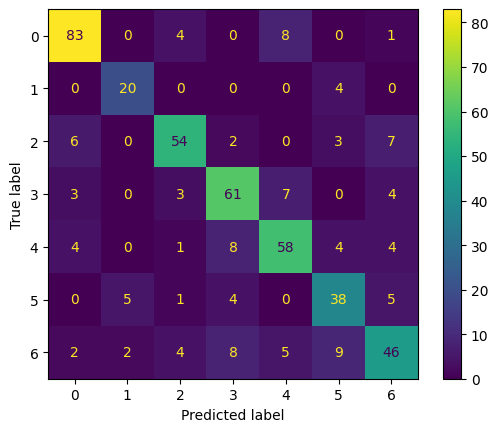


Hard cases for the model:



In [14]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_emo_rav = SVC().set_params(**svm_best_model.get_params())
svm_emo_rav.fit(X_train, y_train)
model_eval(svm_emo_rav, X_train, X_test, y_train, y_test, confusion=True)

### Random Forest
Unfortunately, this is not working on Random Forest. It seems like the test data contains several columns that contain higher values than seen in the training data. Since random forest cannot interpolate, the model is unable to make the predictions for the test set. 

The only thing we could do would be to remove the columns but this is not very comparable to other models then. Still, let's see if it works

In [15]:
df_desc = X_train.describe()
df_desc_test = X_test.describe()

df_desc_max = df_desc.loc['max'].to_list()
df_desc_test_max = df_desc_test.loc['max'].to_list()

# check where test data has higher values than train data
larger_indices = []
    
for i in range(len(df_desc_max)):
    if df_desc_test_max[i] > df_desc_max[i]:
        larger_indices.append(i)
print(larger_indices)
print(len(larger_indices))

[1, 2, 8, 9, 12, 17, 19, 21, 34, 35, 37, 48, 50, 51, 54, 62, 65, 67, 75, 78, 79, 84, 96, 98, 103, 104, 109, 112, 113, 114, 115, 118, 121, 124, 125, 130, 132, 133, 138, 139, 147, 157, 158, 163, 167, 168, 171, 175, 178, 182, 185, 186, 188, 190, 192, 197, 198, 199, 202, 203, 209, 213]
62


In [16]:
X_train_rfc = X_train.drop(X_train.columns[larger_indices], axis=1)
X_test_rfc = X_test.drop(X_test.columns[larger_indices], axis=1)


Evaluation: f1_score
99.93% for the train data
69.87% for the test data

Evaluation: accuracy_score
99.91% for the train data
70.08% for the test data

Evaluation: precision_score
99.92% for the train data
68.99% for the test data

Evaluation: recall_score
99.94% for the train data
71.92% for the test data

Evaluation: confusion_matrix of test predictions


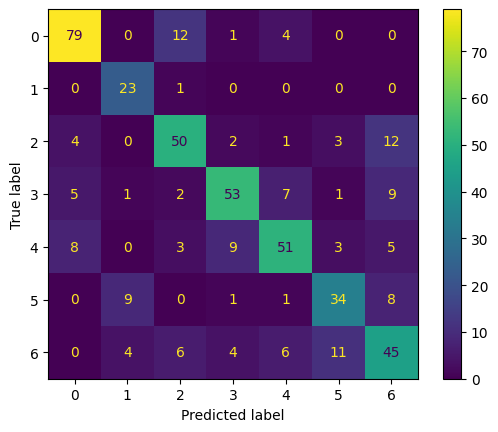


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: neutral(5)
Hard cases of false positives: ['sadness(6)']



In [17]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_emo_rav = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_emo_rav.fit(X_train_rfc, y_train)
model_eval(rfc_emo_rav, X_train_rfc, X_test_rfc, y_train, y_test, confusion=True)

### XGB


Evaluation: f1_score
100.00% for the train data
72.43% for the test data

Evaluation: accuracy_score
100.00% for the train data
71.97% for the test data

Evaluation: precision_score
100.00% for the train data
72.59% for the test data

Evaluation: recall_score
100.00% for the train data
72.48% for the test data

Evaluation: confusion_matrix of test predictions


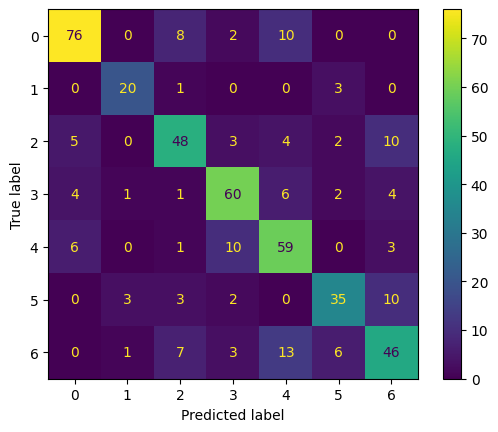


Hard cases for the model:



In [18]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_emo_rav = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_emo_rav.fit(X_train, y_train)
model_eval(xgb_emo_rav, X_train, X_test, y_train, y_test, confusion=True)

## b) EmoDB + Ravdess own feature selection

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (1113, 585)
#### Single_Label Multi_Classification problem ####
No test data filename giv

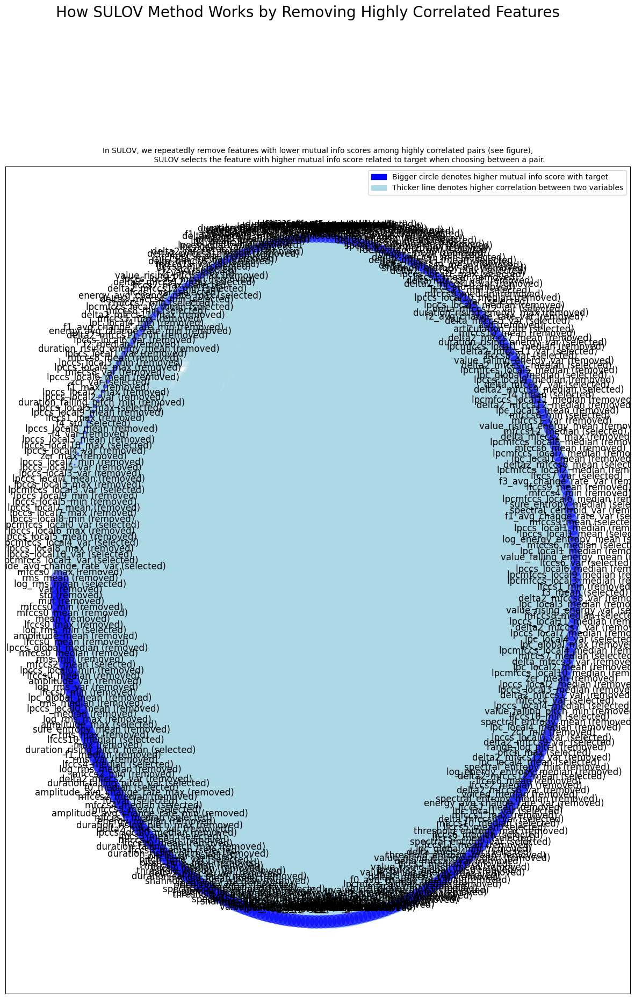

Time taken for SULOV method = 17 seconds
    Adding 0 categorical variables to reduced numeric variables  of 339
Finally 339 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 116 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 12 seconds
            Time taken for regular XGBoost feature selection = 10 seconds
            Time taken for regular XGBoost feature selection = 9 seconds
            Time taken for regular XGBoost feature selection = 7 seconds
            Time taken for regular XGBoost feature selection = 5 sec

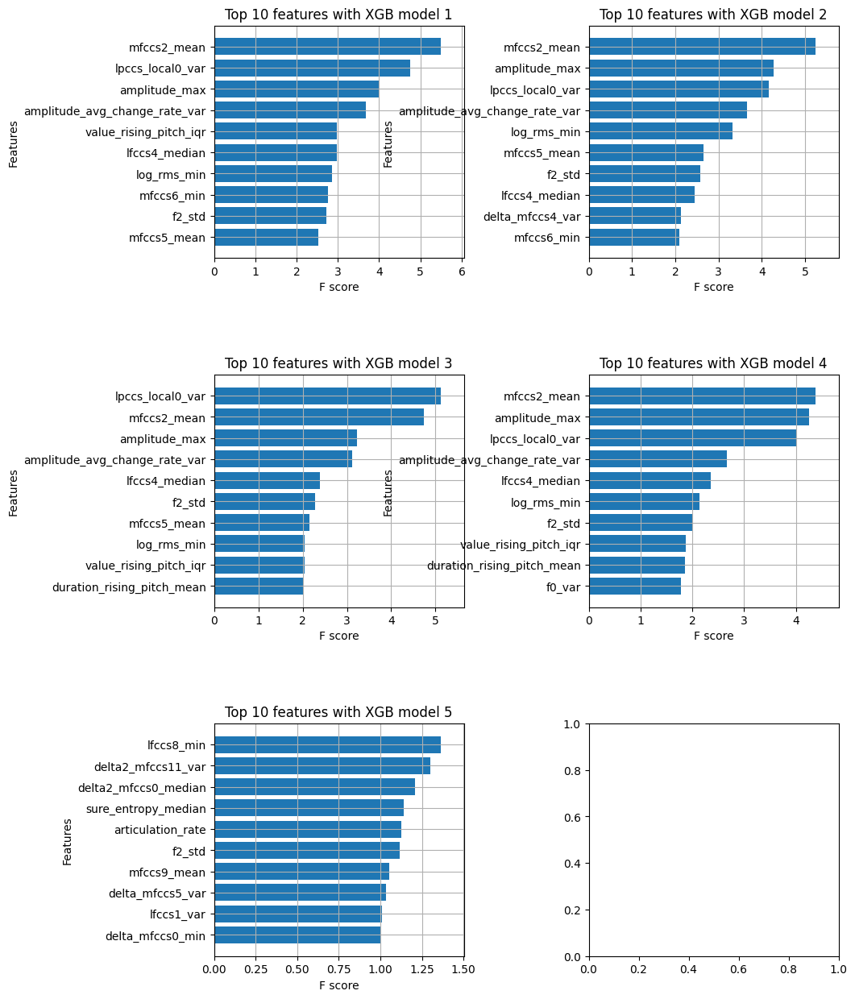

    Completed XGBoost feature selection in 8 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 189 important features. Too many to print...
Total Time taken for featurewiz selection = 62 seconds
Output contains a list of 189 important features and a train dataframe
    Time taken to create entire pipeline = 66 second(s)


In [8]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_emo_rav, verbose=False, test_size=0.3)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  

### SVM


Evaluation: f1_score
100.00% for the train data
78.15% for the test data

Evaluation: accuracy_score
100.00% for the train data
78.87% for the test data

Evaluation: precision_score
100.00% for the train data
78.02% for the test data

Evaluation: recall_score
100.00% for the train data
78.60% for the test data

Evaluation: confusion_matrix of test predictions


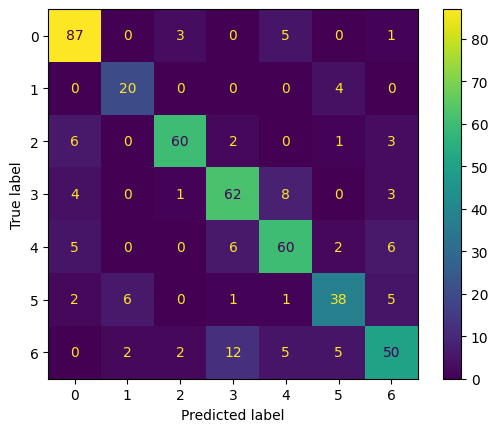


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']



In [9]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_emo_rav_reduced = SVC().set_params(**svm_best_model.get_params())
svm_emo_rav_reduced.fit(X_train, y_train)
model_eval(svm_emo_rav_reduced, X_train, X_test, y_train, y_test, confusion=True)

RBF kernel. Computing permutation importance.


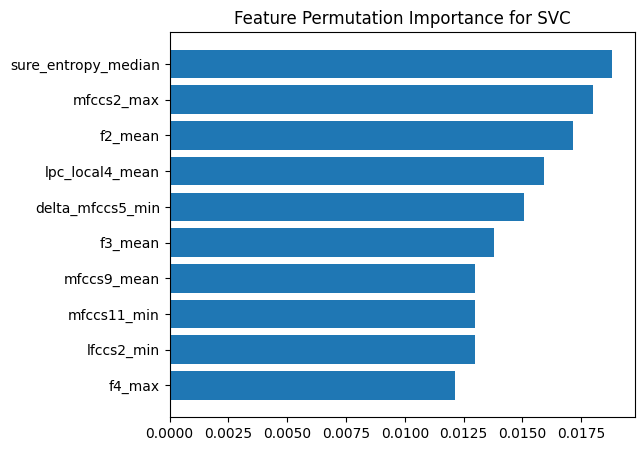

In [10]:
feature_imp_svm = feature_importance(svm_emo_rav_reduced, X_test, y_test, top=10)

In [22]:
feature_imp_svm

('sure_entropy_median',
 'mfccs2_max',
 'f2_mean',
 'lpc_local4_mean',
 'delta_mfccs5_min',
 'f3_mean',
 'mfccs9_mean',
 'mfccs11_min',
 'lfccs2_min',
 'f4_max')

### Random Forest


Evaluation: f1_score
100.00% for the train data
70.45% for the test data

Evaluation: accuracy_score
100.00% for the train data
71.13% for the test data

Evaluation: precision_score
100.00% for the train data
69.86% for the test data

Evaluation: recall_score
100.00% for the train data
71.84% for the test data

Evaluation: confusion_matrix of test predictions


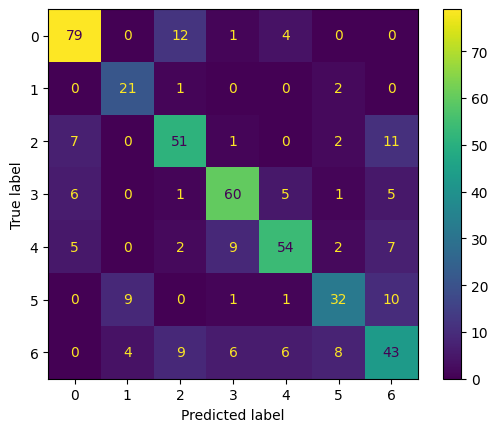


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']



In [23]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_emo_rav_reduced = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_emo_rav_reduced.fit(X_train, y_train)
model_eval(rfc_emo_rav_reduced, X_train, X_test, y_train, y_test, confusion=True)

### XGB


Evaluation: f1_score
100.00% for the train data
68.87% for the test data

Evaluation: accuracy_score
100.00% for the train data
69.67% for the test data

Evaluation: precision_score
100.00% for the train data
69.12% for the test data

Evaluation: recall_score
100.00% for the train data
69.05% for the test data

Evaluation: confusion_matrix of test predictions


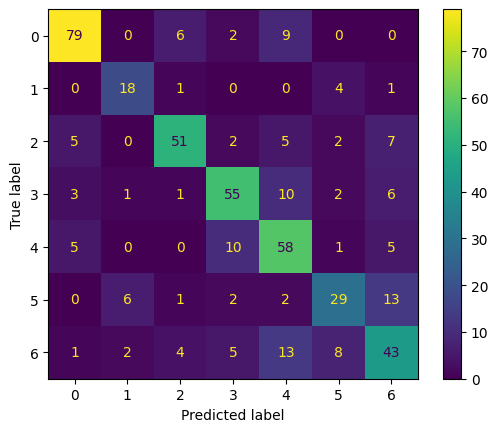


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: neutral(5)
Hard cases of false negatives: ['sadness(6)']



In [24]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_emo_rav_reduced = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_emo_rav_reduced.fit(X_train, y_train)
model_eval(xgb_emo_rav_reduced, X_train, X_test, y_train, y_test, confusion=True)

# 3) IEMOCAP only
## a) Iemocap with most important features from featurewiz 215

In [25]:
# load most important 215 features from featurewiz selection on 70-30 split
with open('../results/most_important_features_70_30_split_215.pkl', 'rb') as f:
    most_imp_features = pickle.load(f)

# add label 
most_imp_features.append('label')
    
# load data
df_iemocap = pd.read_pickle('../results/df_prep_numerical_only_all_stats_iemocap.pkl')

# check if there are any features in the saved set of most important features from emodb
mis_cols = list(set(most_imp_features) - set(df_iemocap.columns.to_list()))
print(f'{mis_cols} are missing in the Iemocap feature set and are removed from the list.')
for feat in mis_cols:
    most_imp_features.remove(feat) 

# select features
df_iemocap_most_imp215 = df_iemocap[most_imp_features]

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_iemocap_most_imp215, test_size=0.3)

[] are missing in the Iemocap feature set and are removed from the list.
A snippet of the data:


,rms_min,lpc_global_mean,value_rising_pitch_iqr,mfccs5_mean,lpc_local4_mean,voiced_var,f1_std,mfccs0_mean,duration_rising_pitch_max,lfccs4_var,spectral_entropy_min,zcr_max,lfccs3_median,skew_log_pitch,duration_rising_pitch_median,speaking_rate,delta_mfccs0_min,shannon_entropy_mean,rms_max,lpcmfccs_local0_median,lfccs5_var,mfccs10_median,lpcmfccs_local10_median,range_log_pitch,delta_mfccs0_mean,mfccs6_median,f1_mean,lfccs9_max,f4_mean,lfccs2_mean,value_rising_pitch_median,amplitude_avg_change_rate_mean,lpc_local2_min,lpc_local3_var,mfccs4_max,duration_falling_pitch_mean,mfccs5_var,lpcmfccs_local4_max,pitch_time_median,value_falling_energy_max,lfccs7_mean,delta_mfccs0_median,value_falling_pitch_max,mfccs9_mean,lfccs11_var,lfccs0_max,value_rising_pitch_mean,delta2_mfccs3_max,spectral_entropy_max,value_falling_pitch_median,amplitude_avg_change_rate_min,delta_mfccs11_max,spectral_centroid_median,f2_var,lpccs_local5_mean,delta2_mfccs0_mean,delta2_mfccs3_min,duration_rising_pitch_iqr,lfccs4_mean,energy_var,mfccs0_max,delta_mfccs7_var,lfccs9_median,f4_avg_change_rate_mean,f1_avg_change_rate_max,mfccs4_min,f2_avg_change_rate_var,threshold_entropy_var,f1_avg_change_rate_median,energy_max,delta2_mfccs6_var,delta_mfccs2_mean,lpc_local4_min,delta2_mfccs2_max,mfccs3_max,delta_mfccs0_var,delta_mfccs1_median,lpccs_local6_min,lfccs2_min,shannon_entropy_var,range_log_energy,lfccs8_var,threshold_entropy_max,value_falling_energy_min,lfccs6_mean,lfccs6_max,zcr_min,delta_mfccs7_mean,f1_avg_change_rate_mean,delta2_mfccs8_mean,delta_mfccs8_min,duration_rising_energy_var,delta2_mfccs2_median,delta_mfccs8_mean,sure_entropy_mean,duration_rising_energy_mean,min,delta2_mfccs11_var,spectral_entropy_var,f2_max,f0_median,max,amplitude_avg_change_rate_max,mfccs9_max,lfccs4_max,mfccs11_max,energy_avg_change_rate_mean,duration_falling_energy_mean,f3_mean,mean,lfccs11_mean,f2_mean,lfccs2_var,f4_avg_change_rate_median,f4_max,lfccs7_var,delta_mfccs11_median,delta_mfccs6_median,f4_avg_change_rate_min,pitch_time_mean,lpcmfccs_local0_min,log_energy_entropy_mean,lpccs_global_median,lfccs11_max,delta2_mfccs3_mean,mfccs1_max,delta2_mfccs3_var,mfccs2_var,delta2_mfccs4_var,lfccs8_max,delta_mfccs0_max,delta_mfccs9_max,delta_mfccs6_max,delta_mfccs5_mean,lfccs8_mean,lfccs10_median,duration_rising_energy_iqr,delta_mfccs9_var,amplitude_var,lpcmfccs_global_min,delta_mfccs3_min,delta_mfccs10_var,value_falling_energy_median,lfccs2_max,lfccs3_var,delta_mfccs4_max,delta_mfccs12_mean,lfccs3_max,delta_mfccs6_mean,mfccs3_median,delta2_mfccs12_mean,delta2_mfccs2_mean,value_falling_pitch_min,delta_mfccs11_mean,mfccs12_min,delta_mfccs6_var,f2_avg_change_rate_median,delta2_mfccs12_median,delta2_mfccs11_median,delta2_mfccs9_min,lpccs_local4_min,f3_std,mfccs7_median,lpc_local1_max,f3_min,delta2_mfccs10_median,delta2_mfccs10_mean,f3_avg_change_rate_mean,duration_falling_energy_var,f4_min,mfccs12_var,threshold_entropy_mean,f3_avg_change_rate_min,delta2_mfccs11_mean,delta2_mfccs0_var,energy_avg_change_rate_max,lpcmfccs_global_max,lfccs6_min,f1_min,energy_median,f4_std,f0_var,mfccs8_mean,delta_mfccs8_max,delta2_mfccs1_max,lfccs0_var,mfccs3_min,delta2_mfccs10_min,lpc_local1_median,lfccs9_min,mfccs11_min,lpc_local1_var,duration_falling_pitch_max,lpc_local1_min,delta2_mfccs1_min,delta_mfccs5_min,mfccs3_var,lfccs5_min,lpcmfccs_local0_var,lpcmfccs_local5_var,mfccs7_min,delta2_mfccs5_max,lpccs_local10_min,lpcmfccs_local1_var,delta2_mfccs7_mean,energy_avg_change_rate_var,delta2_mfccs7_var,delta2_mfccs8_max,lfccs10_var,delta_mfccs3_max,mfccs11_median,mfccs8_min,delta2_mfccs10_max,lfccs5_max,duration_rising_pitch_min
735,-0.254772,4.736867,0.358626,-1.050110,-0.208176,0.878862,0.480009,3.034663,-0.917790,0.663939,-0.030292,0.736942,-1.239561,-0.648948,-0.175662,0.294219,-2.295741,1.205699,4.389817,3.299651,1.669537,-0.712932,0.241406,1.573889,-0.312368,-1.091744,2.676817,-0.097120,-0.031565,-3.384560,-0.113432,-0.865727,0.007342,-0.540225,0.075891,-0.464266,0.942718,0.202882,1.993765,0.168927,-0.666460,

There are 1565 entries with 215 columns in the training data.
There are 672 entries with 215 columns in the testing data.


### SVM


Evaluation: f1_score
99.95% for the train data
46.19% for the test data

Evaluation: accuracy_score
99.94% for the train data
63.84% for the test data

Evaluation: precision_score
99.94% for the train data
46.25% for the test data

Evaluation: recall_score
99.95% for the train data
46.59% for the test data

Evaluation: confusion_matrix of test predictions


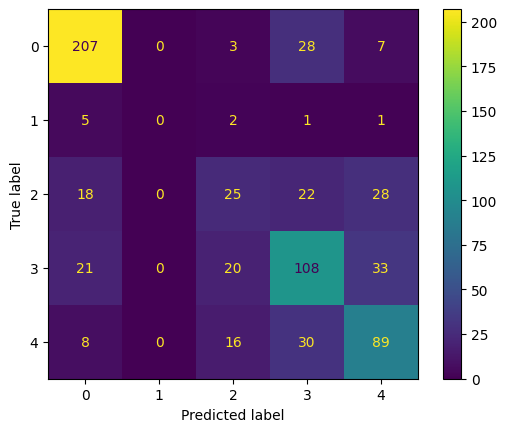


Hard cases for the model:

Label: fear(1)
Hard cases of false negatives: ['anger(0)', 'happiness(2)']

Label: happiness(2)
Hard cases of false negatives: ['neutral(3)', 'sadness(4)']
Hard cases of false positives: ['neutral(3)', 'sadness(4)']

Label: sadness(4)
Hard cases of false negatives: ['neutral(3)']
Hard cases of false positives: ['neutral(3)']



In [26]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_iemocap = SVC().set_params(**svm_best_model.get_params())
svm_iemocap.fit(X_train, y_train)
model_eval(svm_iemocap, X_train, X_test, y_train, y_test, confusion=True, emotions='iemocap')

### Random Forest


Evaluation: f1_score
99.03% for the train data
44.80% for the test data

Evaluation: accuracy_score
98.59% for the train data
63.69% for the test data

Evaluation: precision_score
98.88% for the train data
48.23% for the test data

Evaluation: recall_score
99.21% for the train data
45.72% for the test data

Evaluation: confusion_matrix of test predictions


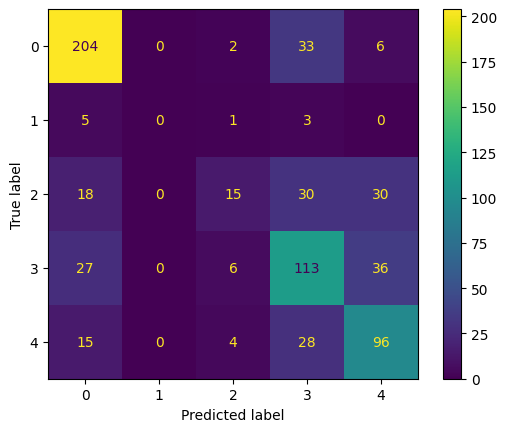


Hard cases for the model:

Label: fear(1)
Hard cases of false negatives: ['anger(0)', 'neutral(3)']

Label: happiness(2)
Hard cases of false negatives: ['neutral(3)', 'sadness(4)']
Hard cases of false positives: ['neutral(3)']

Label: sadness(4)
Hard cases of false positives: ['neutral(3)']



In [27]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_iemocap = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_iemocap.fit(X_train, y_train)
model_eval(rfc_iemocap, X_train, X_test, y_train, y_test, confusion=True, emotions='iemocap')

### XGB


Evaluation: f1_score
97.29% for the train data
44.95% for the test data

Evaluation: accuracy_score
96.81% for the train data
63.24% for the test data

Evaluation: precision_score
97.52% for the train data
46.17% for the test data

Evaluation: recall_score
97.09% for the train data
45.62% for the test data

Evaluation: confusion_matrix of test predictions


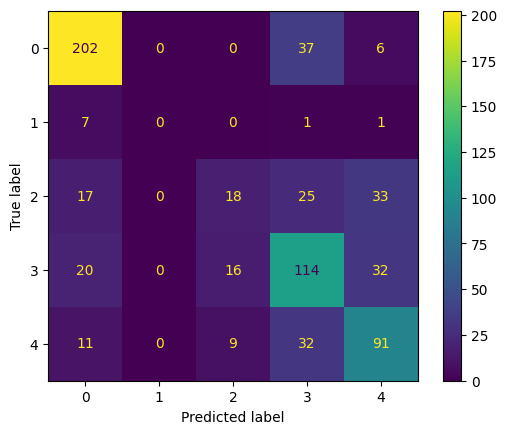


Hard cases for the model:

Label: fear(1)
Hard cases of false negatives: ['anger(0)']

Label: happiness(2)
Hard cases of false negatives: ['neutral(3)', 'sadness(4)']
Hard cases of false positives: ['neutral(3)', 'sadness(4)']

Label: sadness(4)
Hard cases of false negatives: ['neutral(3)']
Hard cases of false positives: ['happiness(2)']



In [28]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_iemocap = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_iemocap.fit(X_train, y_train)
model_eval(xgb_iemocap, X_train, X_test, y_train, y_test, confusion=True, emotions='iemocap')

## b) IEMOCAP own feature selection

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (1565, 595)
#### Single_Label Multi_Classification problem ####
No test data filename giv

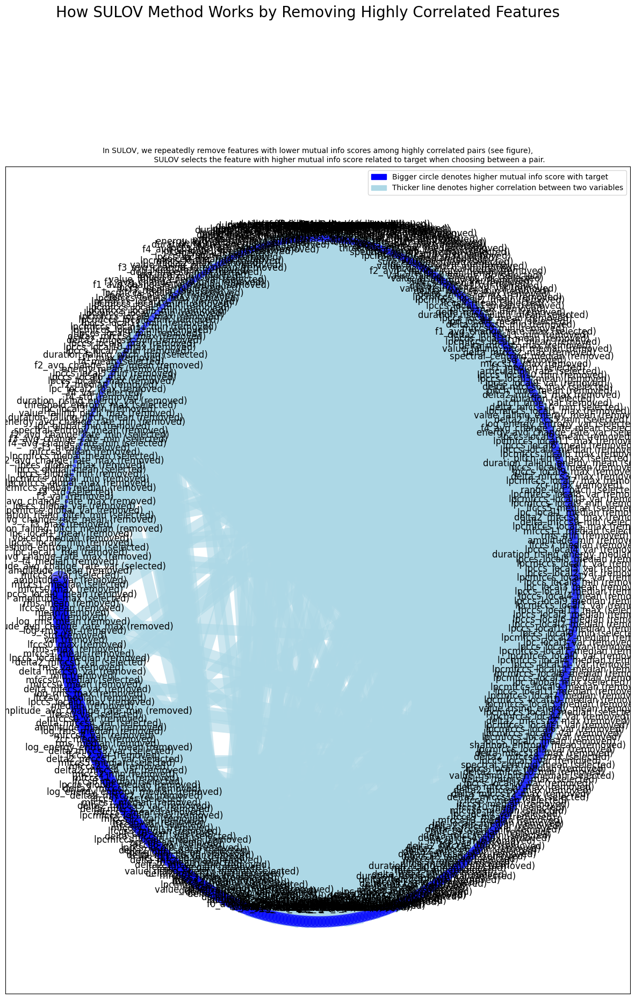

Time taken for SULOV method = 53 seconds
    Adding 0 categorical variables to reduced numeric variables  of 259
Finally 259 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 118 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 23 seconds
            Time taken for regular XGBoost feature selection = 45 seconds
            Time taken for regular XGBoost feature selection = 22 seconds
            Time taken for regular XGBoost feature selection = 15 seconds
            Time taken for regular XGBoost feature selection = 12 

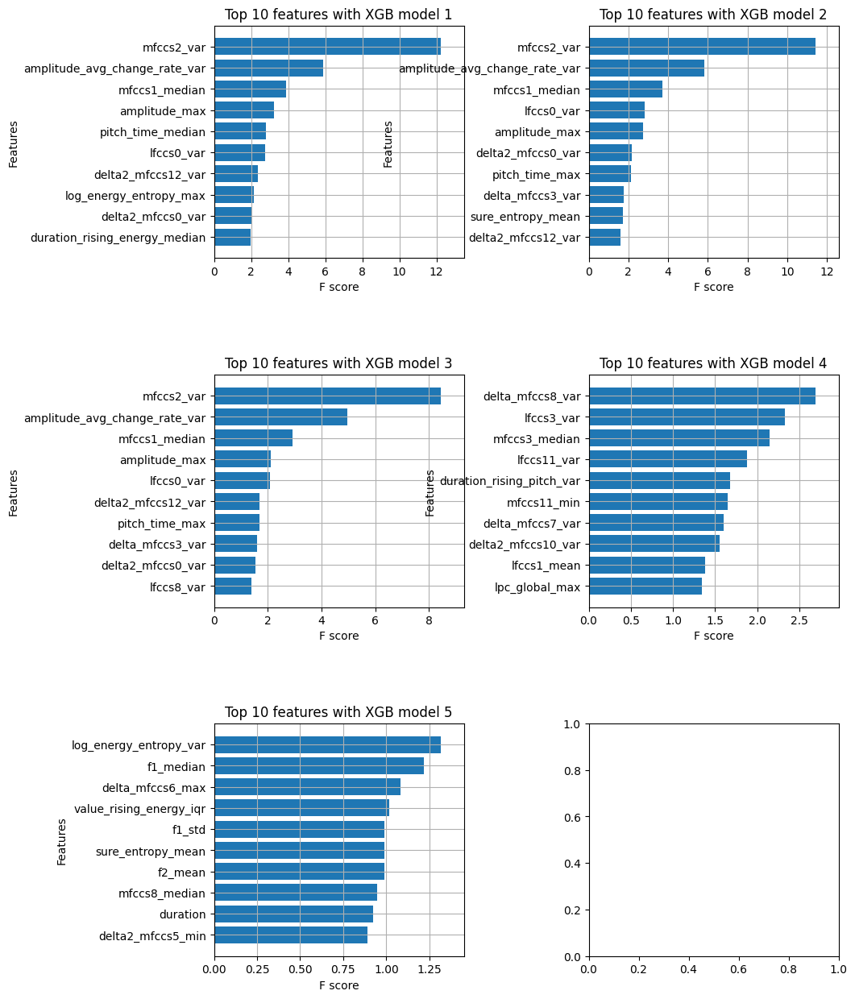

    Completed XGBoost feature selection in 19 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 197 important features. Too many to print...
Total Time taken for featurewiz selection = 177 seconds
Output contains a list of 197 important features and a train dataframe
    Time taken to create entire pipeline = 185 second(s)


In [29]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_iemocap, verbose=False, test_size=0.3)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  

### SVM


Evaluation: f1_score
100.00% for the train data
52.32% for the test data

Evaluation: accuracy_score
100.00% for the train data
65.62% for the test data

Evaluation: precision_score
100.00% for the train data
68.74% for the test data

Evaluation: recall_score
100.00% for the train data
50.60% for the test data

Evaluation: confusion_matrix of test predictions


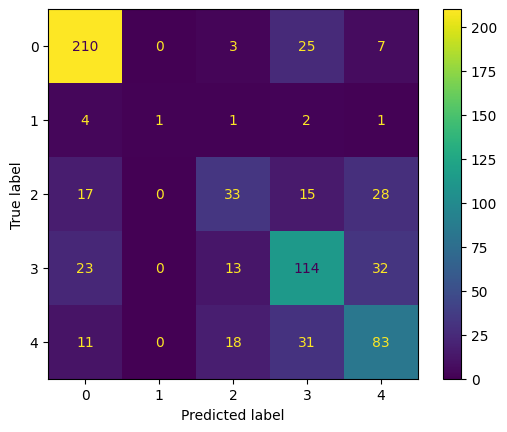


Hard cases for the model:

Label: fear(1)
Hard cases of false negatives: ['anger(0)', 'neutral(3)']

Label: happiness(2)
Hard cases of false negatives: ['sadness(4)']
Hard cases of false positives: ['sadness(4)']

Label: sadness(4)
Hard cases of false negatives: ['neutral(3)']
Hard cases of false positives: ['neutral(3)']



In [30]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_iemocap_reduced = SVC().set_params(**svm_best_model.get_params())
svm_iemocap_reduced.fit(X_train, y_train)
model_eval(svm_iemocap_reduced, X_train, X_test, y_train, y_test, confusion=True, emotions='iemocap')

### Random Forest


Evaluation: f1_score
99.11% for the train data
45.67% for the test data

Evaluation: accuracy_score
98.72% for the train data
64.43% for the test data

Evaluation: precision_score
98.96% for the train data
49.87% for the test data

Evaluation: recall_score
99.29% for the train data
46.34% for the test data

Evaluation: confusion_matrix of test predictions


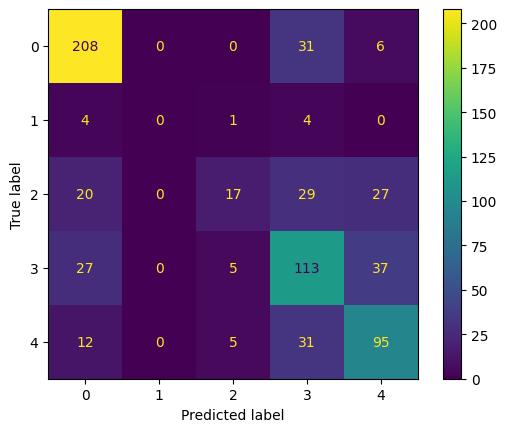


Hard cases for the model:

Label: fear(1)
Hard cases of false negatives: ['anger(0)', 'neutral(3)']

Label: happiness(2)
Hard cases of false negatives: ['anger(0)', 'neutral(3)', 'sadness(4)']

Label: neutral(3)
Hard cases of false negatives: ['sadness(4)']

Label: sadness(4)
Hard cases of false negatives: ['neutral(3)']
Hard cases of false positives: ['neutral(3)']



In [31]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_iemocap_reduced = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_iemocap_reduced.fit(X_train, y_train)
model_eval(rfc_iemocap_reduced, X_train, X_test, y_train, y_test, confusion=True, emotions='iemocap')

### XGB


Evaluation: f1_score
97.30% for the train data
44.67% for the test data

Evaluation: accuracy_score
96.87% for the train data
63.10% for the test data

Evaluation: precision_score
97.43% for the train data
45.25% for the test data

Evaluation: recall_score
97.19% for the train data
45.07% for the test data

Evaluation: confusion_matrix of test predictions


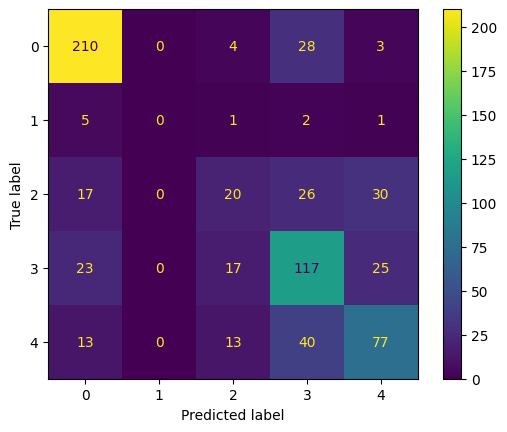


Hard cases for the model:

Label: fear(1)
Hard cases of false negatives: ['anger(0)', 'neutral(3)']

Label: happiness(2)
Hard cases of false negatives: ['neutral(3)', 'sadness(4)']
Hard cases of false positives: ['neutral(3)', 'sadness(4)']

Label: sadness(4)
Hard cases of false negatives: ['neutral(3)']
Hard cases of false positives: ['happiness(2)']



In [32]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_iemocap_reduced = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_iemocap_reduced.fit(X_train, y_train)
model_eval(xgb_iemocap_reduced, X_train, X_test, y_train, y_test, confusion=True, emotions='iemocap')

# 4) EmoDB + IEMOCAP
## a) EmoDB + Iemocap with most important features from featurewiz 215

In [33]:
# load most important 215 features from featurewiz selection on 70-30 split
with open('../results/most_important_features_70_30_split_215.pkl', 'rb') as f:
    most_imp_features = pickle.load(f)

# add label 
most_imp_features.append('label')
    
# load data
df_emo_iemo = pd.read_pickle('../results/df_prep_numerical_only_all_stats_emodb_iemocap.pkl')

# check if there are any features in the saved set of most important features from emodb
mis_cols = list(set(most_imp_features) - set(df_emo_iemo.columns.to_list()))
print(f'{mis_cols} are missing in the Iemocap feature set and are removed from the list.')
for feat in mis_cols:
    most_imp_features.remove(feat) 

# select features
df_emo_iemo_most_imp215 = df_emo_iemo[most_imp_features]

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_emo_iemo_most_imp215, test_size=0.3)

[] are missing in the Iemocap feature set and are removed from the list.
A snippet of the data:


,rms_min,lpc_global_mean,value_rising_pitch_iqr,mfccs5_mean,lpc_local4_mean,voiced_var,f1_std,mfccs0_mean,duration_rising_pitch_max,lfccs4_var,spectral_entropy_min,zcr_max,lfccs3_median,skew_log_pitch,duration_rising_pitch_median,speaking_rate,delta_mfccs0_min,shannon_entropy_mean,rms_max,lpcmfccs_local0_median,lfccs5_var,mfccs10_median,lpcmfccs_local10_median,range_log_pitch,delta_mfccs0_mean,mfccs6_median,f1_mean,lfccs9_max,f4_mean,lfccs2_mean,value_rising_pitch_median,amplitude_avg_change_rate_mean,lpc_local2_min,lpc_local3_var,mfccs4_max,duration_falling_pitch_mean,mfccs5_var,lpcmfccs_local4_max,pitch_time_median,value_falling_energy_max,lfccs7_mean,delta_mfccs0_median,value_falling_pitch_max,mfccs9_mean,lfccs11_var,lfccs0_max,value_rising_pitch_mean,delta2_mfccs3_max,spectral_entropy_max,value_falling_pitch_median,amplitude_avg_change_rate_min,delta_mfccs11_max,spectral_centroid_median,f2_var,lpccs_local5_mean,delta2_mfccs0_mean,delta2_mfccs3_min,duration_rising_pitch_iqr,lfccs4_mean,energy_var,mfccs0_max,delta_mfccs7_var,lfccs9_median,f4_avg_change_rate_mean,f1_avg_change_rate_max,mfccs4_min,f2_avg_change_rate_var,threshold_entropy_var,f1_avg_change_rate_median,energy_max,delta2_mfccs6_var,delta_mfccs2_mean,lpc_local4_min,delta2_mfccs2_max,mfccs3_max,delta_mfccs0_var,delta_mfccs1_median,lpccs_local6_min,lfccs2_min,shannon_entropy_var,range_log_energy,lfccs8_var,threshold_entropy_max,value_falling_energy_min,lfccs6_mean,lfccs6_max,zcr_min,delta_mfccs7_mean,f1_avg_change_rate_mean,delta2_mfccs8_mean,delta_mfccs8_min,duration_rising_energy_var,delta2_mfccs2_median,delta_mfccs8_mean,sure_entropy_mean,duration_rising_energy_mean,min,delta2_mfccs11_var,spectral_entropy_var,f2_max,f0_median,max,amplitude_avg_change_rate_max,mfccs9_max,lfccs4_max,mfccs11_max,energy_avg_change_rate_mean,duration_falling_energy_mean,f3_mean,mean,lfccs11_mean,f2_mean,lfccs2_var,f4_avg_change_rate_median,f4_max,lfccs7_var,delta_mfccs11_median,delta_mfccs6_median,f4_avg_change_rate_min,pitch_time_mean,lpcmfccs_local0_min,log_energy_entropy_mean,lpccs_global_median,lfccs11_max,delta2_mfccs3_mean,mfccs1_max,delta2_mfccs3_var,mfccs2_var,delta2_mfccs4_var,lfccs8_max,delta_mfccs0_max,delta_mfccs9_max,delta_mfccs6_max,delta_mfccs5_mean,lfccs8_mean,lfccs10_median,duration_rising_energy_iqr,delta_mfccs9_var,amplitude_var,lpcmfccs_global_min,delta_mfccs3_min,delta_mfccs10_var,value_falling_energy_median,lfccs2_max,lfccs3_var,delta_mfccs4_max,delta_mfccs12_mean,lfccs3_max,delta_mfccs6_mean,mfccs3_median,delta2_mfccs12_mean,delta2_mfccs2_mean,value_falling_pitch_min,delta_mfccs11_mean,mfccs12_min,delta_mfccs6_var,f2_avg_change_rate_median,delta2_mfccs12_median,delta2_mfccs11_median,delta2_mfccs9_min,lpccs_local4_min,f3_std,mfccs7_median,lpc_local1_max,f3_min,delta2_mfccs10_median,delta2_mfccs10_mean,f3_avg_change_rate_mean,duration_falling_energy_var,f4_min,mfccs12_var,threshold_entropy_mean,f3_avg_change_rate_min,delta2_mfccs11_mean,delta2_mfccs0_var,energy_avg_change_rate_max,lpcmfccs_global_max,lfccs6_min,f1_min,energy_median,f4_std,f0_var,mfccs8_mean,delta_mfccs8_max,delta2_mfccs1_max,lfccs0_var,mfccs3_min,delta2_mfccs10_min,lpc_local1_median,lfccs9_min,mfccs11_min,lpc_local1_var,duration_falling_pitch_max,lpc_local1_min,delta2_mfccs1_min,delta_mfccs5_min,mfccs3_var,lfccs5_min,lpcmfccs_local0_var,lpcmfccs_local5_var,mfccs7_min,delta2_mfccs5_max,lpccs_local10_min,lpcmfccs_local1_var,delta2_mfccs7_mean,energy_avg_change_rate_var,delta2_mfccs7_var,delta2_mfccs8_max,lfccs10_var,delta_mfccs3_max,mfccs11_median,mfccs8_min,delta2_mfccs10_max,lfccs5_max,duration_rising_pitch_min
128,-0.747169,4.592884,1.548254,-1.710482,0.420282,0.360505,0.891953,1.249423,-0.903330,1.217872,-0.797215,0.914389,-3.279260,-1.188379,0.101422,1.668379,-4.855433,0.310947,1.146560,1.881424,2.555062,-0.101034,0.465133,0.465247,-4.358552,-1.939695,1.737913,-0.049031,-0.104625,-1.932551,0.230876,-1.510745,-0.326977,-0.094793,0.049807,-0.172081,-0.213985,0.179271,-0.735371,0.003573,0.187883,2

There are 1941 entries with 215 columns in the training data.
There are 832 entries with 215 columns in the testing data.


### SVM


Evaluation: f1_score
99.43% for the train data
68.31% for the test data

Evaluation: accuracy_score
99.07% for the train data
68.99% for the test data

Evaluation: precision_score
99.35% for the train data
74.47% for the test data

Evaluation: recall_score
99.52% for the train data
64.74% for the test data

Evaluation: confusion_matrix of test predictions


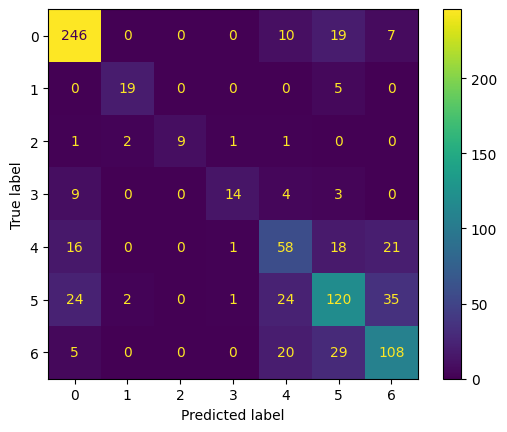


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false positives: ['neutral(5)']

Label: sadness(6)
Hard cases of false positives: ['neutral(5)']



In [34]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_emo_iemo = SVC().set_params(**svm_best_model.get_params())
svm_emo_iemo.fit(X_train, y_train)
model_eval(svm_emo_iemo, X_train, X_test, y_train, y_test, confusion=True)

### Random Forest


Evaluation: f1_score
98.59% for the train data
59.08% for the test data

Evaluation: accuracy_score
97.42% for the train data
64.06% for the test data

Evaluation: precision_score
98.44% for the train data
61.02% for the test data

Evaluation: recall_score
98.79% for the train data
62.52% for the test data

Evaluation: confusion_matrix of test predictions


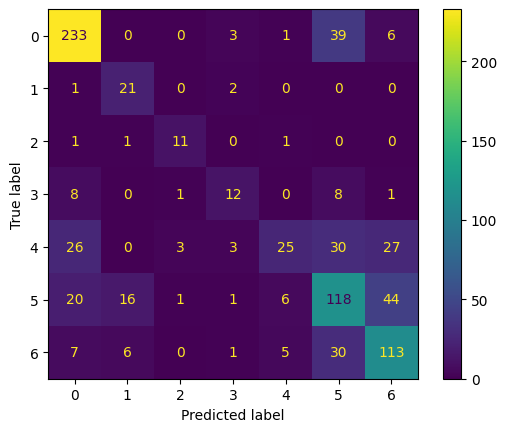


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)', 'neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)', 'neutral(5)', 'sadness(6)']

Label: neutral(5)
Hard cases of false negatives: ['sadness(6)']

Label: sadness(6)
Hard cases of false positives: ['neutral(5)']



In [35]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_emo_iemo = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_emo_iemo.fit(X_train, y_train)
model_eval(rfc_emo_iemo, X_train, X_test, y_train, y_test, confusion=True)

### XGB


Evaluation: f1_score
96.89% for the train data
60.96% for the test data

Evaluation: accuracy_score
95.26% for the train data
67.79% for the test data

Evaluation: precision_score
97.21% for the train data
70.03% for the test data

Evaluation: recall_score
96.63% for the train data
56.56% for the test data

Evaluation: confusion_matrix of test predictions


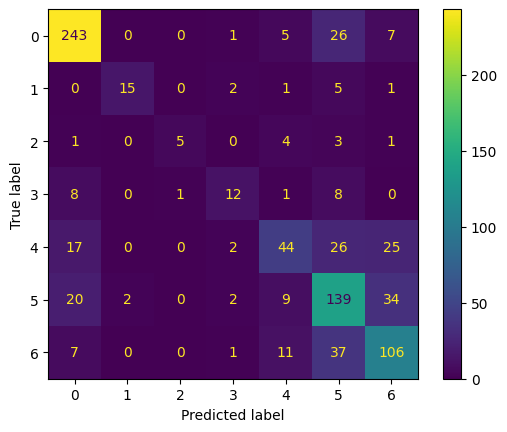


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['happiness(4)', 'neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)', 'neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['neutral(5)', 'sadness(6)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']



In [36]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_emo_iemo = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_emo_iemo.fit(X_train, y_train)
model_eval(xgb_emo_iemo, X_train, X_test, y_train, y_test, confusion=True)

# b) EmoDB + Iemocap own feature selection

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (1941, 594)
#### Single_Label Multi_Classification problem ####
No test data filename giv

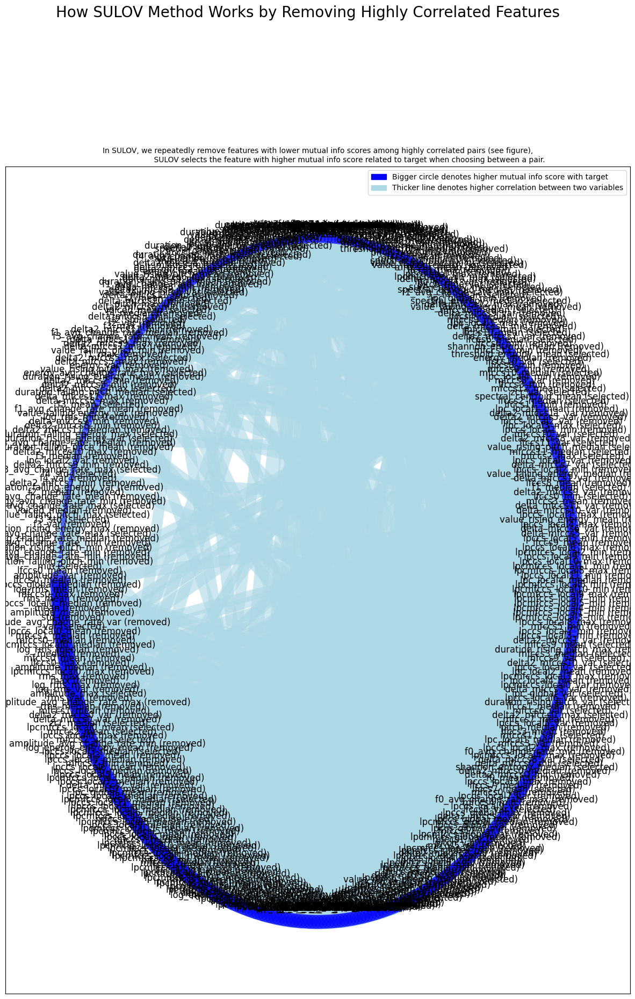

Time taken for SULOV method = 44 seconds
    Adding 0 categorical variables to reduced numeric variables  of 259
Finally 259 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 118 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 26 seconds
            Time taken for regular XGBoost feature selection = 21 seconds
            Time taken for regular XGBoost feature selection = 15 seconds
            Time taken for regular XGBoost feature selection = 11 seconds
            Time taken for regular XGBoost feature selection = 6 s

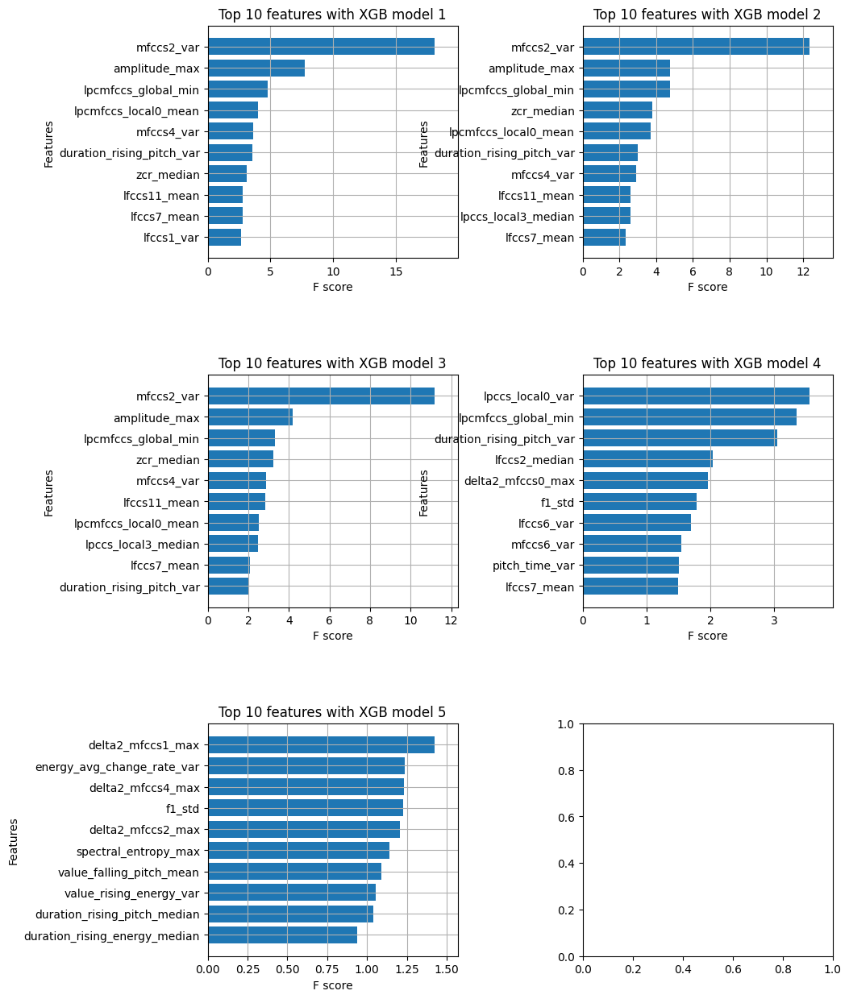

    Completed XGBoost feature selection in 9 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 194 important features. Too many to print...
Total Time taken for featurewiz selection = 126 seconds
Output contains a list of 194 important features and a train dataframe
    Time taken to create entire pipeline = 134 second(s)


In [37]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_emo_iemo, verbose=False, test_size=0.3)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  

### SVM


Evaluation: f1_score
99.64% for the train data
63.85% for the test data

Evaluation: accuracy_score
99.38% for the train data
67.55% for the test data

Evaluation: precision_score
99.57% for the train data
67.56% for the test data

Evaluation: recall_score
99.71% for the train data
61.84% for the test data

Evaluation: confusion_matrix of test predictions


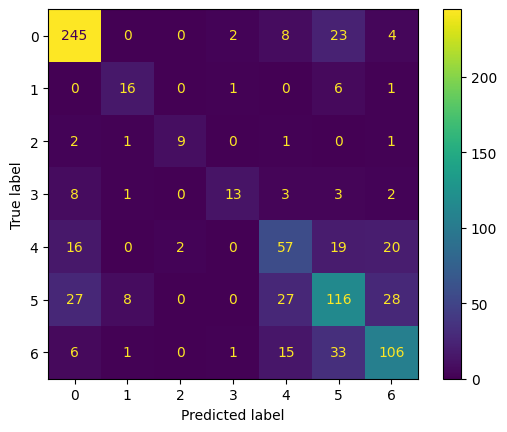


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false positives: ['neutral(5)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']



In [38]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_emo_iemo_reduced = SVC().set_params(**svm_best_model.get_params())
svm_emo_iemo_reduced.fit(X_train, y_train)
model_eval(svm_emo_iemo_reduced, X_train, X_test, y_train, y_test, confusion=True)

### Random Forest


Evaluation: f1_score
98.73% for the train data
58.14% for the test data

Evaluation: accuracy_score
97.73% for the train data
64.78% for the test data

Evaluation: precision_score
98.55% for the train data
60.04% for the test data

Evaluation: recall_score
98.95% for the train data
60.60% for the test data

Evaluation: confusion_matrix of test predictions


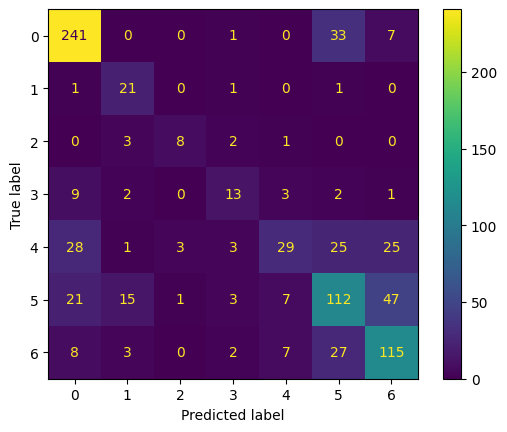


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['happiness(4)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)', 'neutral(5)', 'sadness(6)']

Label: neutral(5)
Hard cases of false negatives: ['sadness(6)']

Label: sadness(6)
Hard cases of false positives: ['neutral(5)']



In [39]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_emo_iemo_reduced = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_emo_iemo_reduced.fit(X_train, y_train)
model_eval(rfc_emo_iemo_reduced, X_train, X_test, y_train, y_test, confusion=True)

### XGB


Evaluation: f1_score
96.64% for the train data
60.73% for the test data

Evaluation: accuracy_score
95.11% for the train data
67.67% for the test data

Evaluation: precision_score
97.10% for the train data
70.73% for the test data

Evaluation: recall_score
96.29% for the train data
55.92% for the test data

Evaluation: confusion_matrix of test predictions


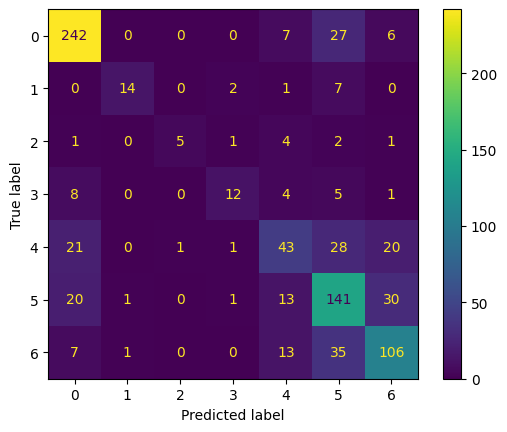


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['happiness(4)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['neutral(5)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']



In [40]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_emo_iemo_reduced = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_emo_iemo_reduced.fit(X_train, y_train)
model_eval(xgb_emo_iemo_reduced, X_train, X_test, y_train, y_test, confusion=True)

# 4) EmoDB + RAVDESS + IEMOCAP
## a) EmoDB + Ravdess + Iemocap with most important features from featurewiz 97

In [41]:
# load most important 215 features from featurewiz selection on 70-30 split
with open('../results/most_important_features_70_30_split_215.pkl', 'rb') as f:
    most_imp_features = pickle.load(f)

# add label 
most_imp_features.append('label')
    
# load data
df_emo_rav_iemo = pd.read_pickle('../results/df_prep_numerical_only_all_stats_emodb_ravdess_iemocap.pkl')

# check if there are any features in the saved set of most important features from emodb
mis_cols = list(set(most_imp_features) - set(df_emo_rav_iemo.columns.to_list()))
print(f'{mis_cols} are missing in the Iemocap/Ravdess feature set and are removed from the list.')
for feat in mis_cols:
    most_imp_features.remove(feat) 

# select features
df_emo_rav_iemo_most_imp215 = df_emo_rav_iemo[most_imp_features]

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_emo_rav_iemo_most_imp215, test_size=0.3)

['lpcmfccs_local0_var', 'lpcmfccs_local5_var', 'lpcmfccs_local1_var'] are missing in the Iemocap/Ravdess feature set and are removed from the list.
A snippet of the data:


,rms_min,lpc_global_mean,value_rising_pitch_iqr,mfccs5_mean,lpc_local4_mean,voiced_var,f1_std,mfccs0_mean,duration_rising_pitch_max,lfccs4_var,spectral_entropy_min,zcr_max,lfccs3_median,skew_log_pitch,duration_rising_pitch_median,speaking_rate,delta_mfccs0_min,shannon_entropy_mean,rms_max,lpcmfccs_local0_median,lfccs5_var,mfccs10_median,lpcmfccs_local10_median,range_log_pitch,delta_mfccs0_mean,mfccs6_median,f1_mean,lfccs9_max,f4_mean,lfccs2_mean,value_rising_pitch_median,amplitude_avg_change_rate_mean,lpc_local2_min,lpc_local3_var,mfccs4_max,duration_falling_pitch_mean,mfccs5_var,lpcmfccs_local4_max,pitch_time_median,value_falling_energy_max,lfccs7_mean,delta_mfccs0_median,value_falling_pitch_max,mfccs9_mean,lfccs11_var,lfccs0_max,value_rising_pitch_mean,delta2_mfccs3_max,spectral_entropy_max,value_falling_pitch_median,amplitude_avg_change_rate_min,delta_mfccs11_max,spectral_centroid_median,f2_var,lpccs_local5_mean,delta2_mfccs0_mean,delta2_mfccs3_min,duration_rising_pitch_iqr,lfccs4_mean,energy_var,mfccs0_max,delta_mfccs7_var,lfccs9_median,f4_avg_change_rate_mean,f1_avg_change_rate_max,mfccs4_min,f2_avg_change_rate_var,threshold_entropy_var,f1_avg_change_rate_median,energy_max,delta2_mfccs6_var,delta_mfccs2_mean,lpc_local4_min,delta2_mfccs2_max,mfccs3_max,delta_mfccs0_var,delta_mfccs1_median,lpccs_local6_min,lfccs2_min,shannon_entropy_var,range_log_energy,lfccs8_var,threshold_entropy_max,value_falling_energy_min,lfccs6_mean,lfccs6_max,zcr_min,delta_mfccs7_mean,f1_avg_change_rate_mean,delta2_mfccs8_mean,delta_mfccs8_min,duration_rising_energy_var,delta2_mfccs2_median,delta_mfccs8_mean,sure_entropy_mean,duration_rising_energy_mean,min,delta2_mfccs11_var,spectral_entropy_var,f2_max,f0_median,max,amplitude_avg_change_rate_max,mfccs9_max,lfccs4_max,mfccs11_max,energy_avg_change_rate_mean,duration_falling_energy_mean,f3_mean,mean,lfccs11_mean,f2_mean,lfccs2_var,f4_avg_change_rate_median,f4_max,lfccs7_var,delta_mfccs11_median,delta_mfccs6_median,f4_avg_change_rate_min,pitch_time_mean,lpcmfccs_local0_min,log_energy_entropy_mean,lpccs_global_median,lfccs11_max,delta2_mfccs3_mean,mfccs1_max,delta2_mfccs3_var,mfccs2_var,delta2_mfccs4_var,lfccs8_max,delta_mfccs0_max,delta_mfccs9_max,delta_mfccs6_max,delta_mfccs5_mean,lfccs8_mean,lfccs10_median,duration_rising_energy_iqr,delta_mfccs9_var,amplitude_var,lpcmfccs_global_min,delta_mfccs3_min,delta_mfccs10_var,value_falling_energy_median,lfccs2_max,lfccs3_var,delta_mfccs4_max,delta_mfccs12_mean,lfccs3_max,delta_mfccs6_mean,mfccs3_median,delta2_mfccs12_mean,delta2_mfccs2_mean,value_falling_pitch_min,delta_mfccs11_mean,mfccs12_min,delta_mfccs6_var,f2_avg_change_rate_median,delta2_mfccs12_median,delta2_mfccs11_median,delta2_mfccs9_min,lpccs_local4_min,f3_std,mfccs7_median,lpc_local1_max,f3_min,delta2_mfccs10_median,delta2_mfccs10_mean,f3_avg_change_rate_mean,duration_falling_energy_var,f4_min,mfccs12_var,threshold_entropy_mean,f3_avg_change_rate_min,delta2_mfccs11_mean,delta2_mfccs0_var,energy_avg_change_rate_max,lpcmfccs_global_max,lfccs6_min,f1_min,energy_median,f4_std,f0_var,mfccs8_mean,delta_mfccs8_max,delta2_mfccs1_max,lfccs0_var,mfccs3_min,delta2_mfccs10_min,lpc_local1_median,lfccs9_min,mfccs11_min,lpc_local1_var,duration_falling_pitch_max,lpc_local1_min,delta2_mfccs1_min,delta_mfccs5_min,mfccs3_var,lfccs5_min,mfccs7_min,delta2_mfccs5_max,lpccs_local10_min,delta2_mfccs7_mean,energy_avg_change_rate_var,delta2_mfccs7_var,delta2_mfccs8_max,lfccs10_var,delta_mfccs3_max,mfccs11_median,mfccs8_min,delta2_mfccs10_max,lfccs5_max,duration_rising_pitch_min
3240,-0.100537,-0.220338,0.978818,-0.966706,0.298902,-0.837828,-0.414632,0.404435,-1.141947,0.555478,-0.254098,1.277747,1.012487,-0.422402,-0.383058,0.726518,0.869249,0.981756,-0.299627,0.545778,0.719059,-2.311410,0.062700,0.755059,0.157784,-2.795934,-0.375962,0.078870,0.566240,-0.670340,0.022221,0.235966,0.032316,-0.019791,-0.400611,-0.366519,0.711159,-0.01932,-0.418151,0.139521,1.138288,-1.474107,0.085853,-0.680679,0.958882,-0.145164,0.295317,-0.5

There are 2680 entries with 212 columns in the training data.
There are 1149 entries with 212 columns in the testing data.


### SVM


Evaluation: f1_score
99.45% for the train data
66.25% for the test data

Evaluation: accuracy_score
99.22% for the train data
66.67% for the test data

Evaluation: precision_score
99.37% for the train data
67.38% for the test data

Evaluation: recall_score
99.54% for the train data
65.39% for the test data

Evaluation: confusion_matrix of test predictions


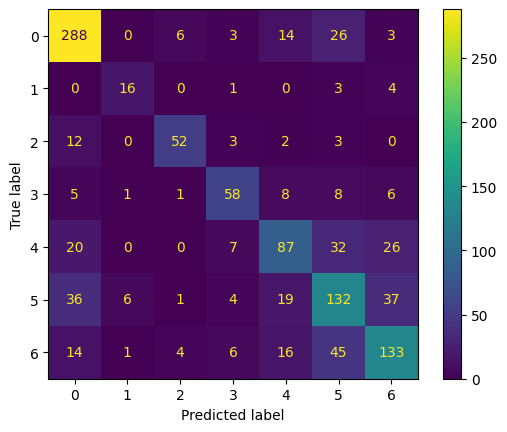


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']



In [42]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_emo_rav_iemo = SVC().set_params(**svm_best_model.get_params())
svm_emo_rav_iemo.fit(X_train, y_train)
model_eval(svm_emo_rav_iemo, X_train, X_test, y_train, y_test, confusion=True)

### Random Forest


Evaluation: f1_score
95.38% for the train data
59.18% for the test data

Evaluation: accuracy_score
95.71% for the train data
60.40% for the test data

Evaluation: precision_score
93.83% for the train data
60.00% for the test data

Evaluation: recall_score
97.56% for the train data
64.70% for the test data

Evaluation: confusion_matrix of test predictions


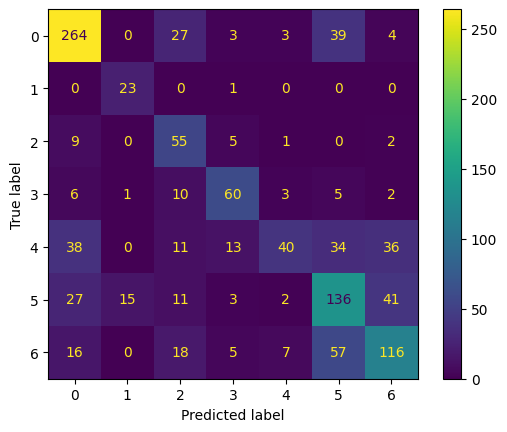


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false positives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)', 'sadness(6)']

Label: neutral(5)
Hard cases of false positives: ['sadness(6)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']



In [43]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_emo_rav_iemo = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_emo_rav_iemo.fit(X_train, y_train)
model_eval(rfc_emo_rav_iemo, X_train, X_test, y_train, y_test, confusion=True)

### XGB


Evaluation: f1_score
94.21% for the train data
62.97% for the test data

Evaluation: accuracy_score
92.61% for the train data
63.71% for the test data

Evaluation: precision_score
94.79% for the train data
65.92% for the test data

Evaluation: recall_score
93.85% for the train data
61.27% for the test data

Evaluation: confusion_matrix of test predictions


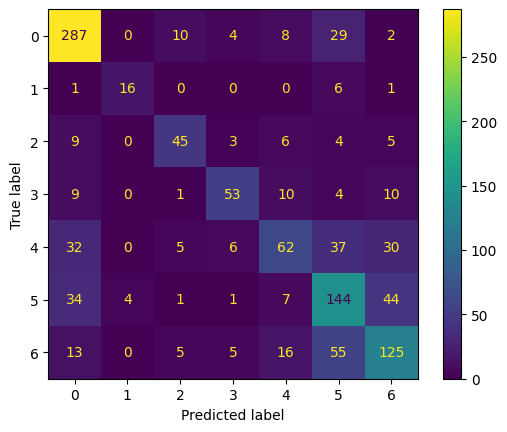


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['neutral(5)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']



In [44]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_emo_rav_iemo = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_emo_rav_iemo.fit(X_train, y_train)
model_eval(xgb_emo_rav_iemo, X_train, X_test, y_train, y_test, confusion=True)

## b) EmoDB + Ravdess + Iemocap own feature selection

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (2680, 576)
#### Single_Label Multi_Classification problem ####
No test data filename giv

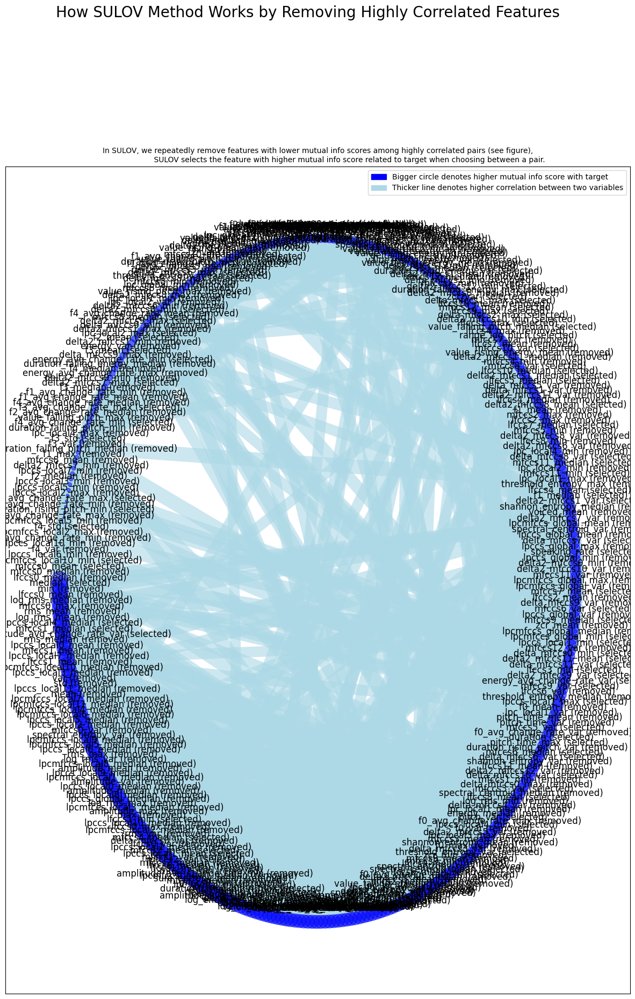

Time taken for SULOV method = 29 seconds
    Adding 0 categorical variables to reduced numeric variables  of 322
Finally 322 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 115 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 39 seconds
            Time taken for regular XGBoost feature selection = 30 seconds
            Time taken for regular XGBoost feature selection = 28 seconds
            Time taken for regular XGBoost feature selection = 22 seconds
            Time taken for regular XGBoost feature selection = 16 

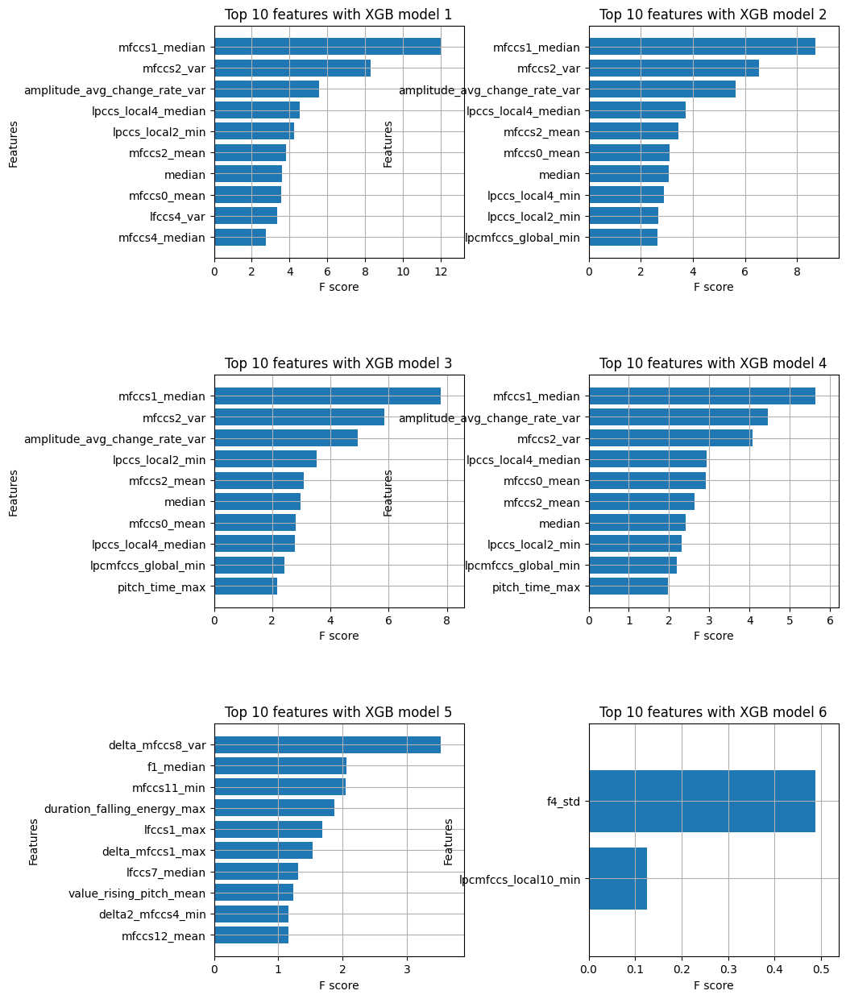

    Completed XGBoost feature selection in 4 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 177 important features. Too many to print...
Total Time taken for featurewiz selection = 168 seconds
Output contains a list of 177 important features and a train dataframe
    Time taken to create entire pipeline = 173 second(s)


In [45]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_emo_rav_iemo, verbose=False, test_size=0.3)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  

### SVM


Evaluation: f1_score
99.64% for the train data
69.02% for the test data

Evaluation: accuracy_score
99.44% for the train data
68.32% for the test data

Evaluation: precision_score
99.60% for the train data
70.06% for the test data

Evaluation: recall_score
99.68% for the train data
68.44% for the test data

Evaluation: confusion_matrix of test predictions


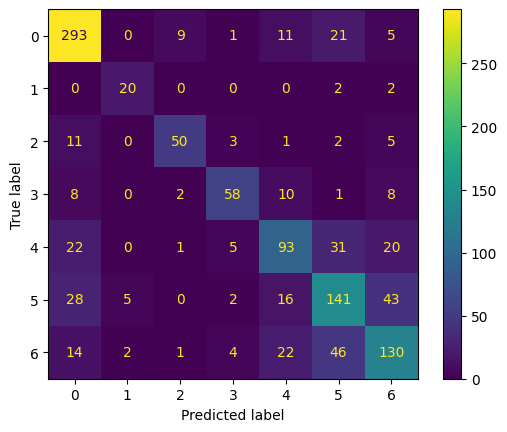


Hard cases for the model:

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']



In [46]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='final')
svm_emo_rav_iemo_reduced = SVC().set_params(**svm_best_model.get_params())
svm_emo_rav_iemo_reduced.fit(X_train, y_train)
model_eval(svm_emo_rav_iemo_reduced, X_train, X_test, y_train, y_test, confusion=True)

### Random Forest


Evaluation: f1_score
95.75% for the train data
58.61% for the test data

Evaluation: accuracy_score
96.27% for the train data
60.40% for the test data

Evaluation: precision_score
94.09% for the train data
59.00% for the test data

Evaluation: recall_score
97.87% for the train data
65.16% for the test data

Evaluation: confusion_matrix of test predictions


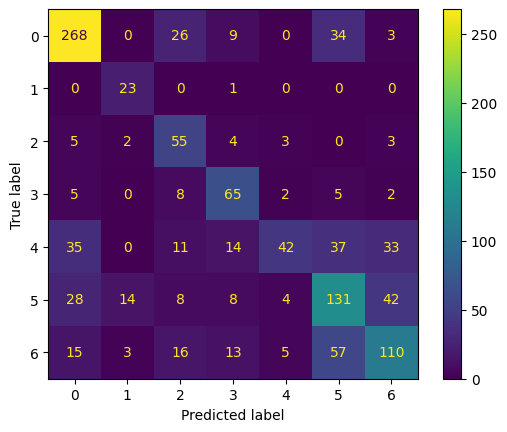


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false positives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)', 'neutral(5)']

Label: neutral(5)
Hard cases of false positives: ['sadness(6)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']



In [47]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro', name_spec='final')
rfc_emo_rav_iemo_reduced = RandomForestClassifier().set_params(**rfc_best_model.get_params())
rfc_emo_rav_iemo_reduced.fit(X_train, y_train)
model_eval(rfc_emo_rav_iemo_reduced, X_train, X_test, y_train, y_test, confusion=True)

### XGB


Evaluation: f1_score
94.00% for the train data
63.57% for the test data

Evaluation: accuracy_score
92.35% for the train data
63.45% for the test data

Evaluation: precision_score
94.77% for the train data
66.29% for the test data

Evaluation: recall_score
93.48% for the train data
62.02% for the test data

Evaluation: confusion_matrix of test predictions


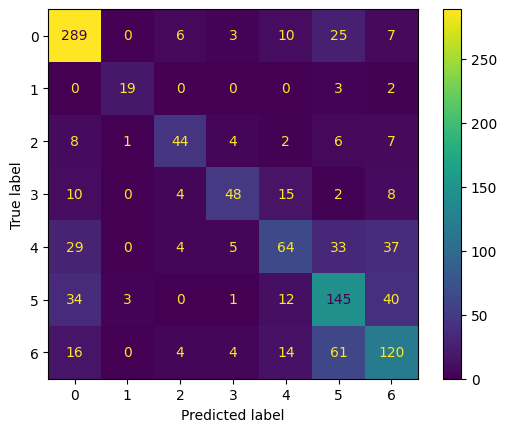


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['sadness(6)']

Label: neutral(5)
Hard cases of false positives: ['sadness(6)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']



In [48]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')
xgb_emo_rav_iemo_reducedd = XGBClassifier().set_params(**xgb_best_model.get_params())
xgb_emo_rav_iemo_reducedd.fit(X_train, y_train)
model_eval(xgb_emo_rav_iemo_reducedd, X_train, X_test, y_train, y_test, confusion=True)